# WordStructure Comptages sur Vlexique2
Utilisé pour les graphes suivants :
- Distribution-FormsLexemes
- Distribution-FormsTenses
- Distribution-FormsPersons
- Distribution-S4-FormsTenses
- Cooccurrences-S4-FormsTenses

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import math
from matplotlib.colors import LinearSegmentedColormap
rep="/Volumes/BroadExt/sDrive/Recherche/Boye/HDR/Data/vlexique2.0.3/"
rep="/Users/gilles/sDrive/Recherche/Boye/HDR/Data/vlexique2.0.3/"
repOut=rep+"WordStructure/"
pd.__version__

'2.2.3'

In [27]:
sns.set_style("whitegrid")

In [154]:
%store -r dSwim cellOrd
cellOrd

['inf',
 'pP',
 'ppMS',
 'ppMP',
 'ppFS',
 'ppFP',
 'pi1S',
 'pi2S',
 'pi3S',
 'pi1P',
 'pi2P',
 'pi3P',
 'pI2S',
 'pI1P',
 'pI2P',
 'ps1S',
 'ps2S',
 'ps3S',
 'ps1P',
 'ps2P',
 'ps3P',
 'ii1S',
 'ii2S',
 'ii3S',
 'ii1P',
 'ii2P',
 'ii3P',
 'fi1S',
 'fi2S',
 'fi3S',
 'fi1P',
 'fi2P',
 'fi3P',
 'pc1S',
 'pc2S',
 'pc3S',
 'pc1P',
 'pc2P',
 'pc3P',
 'ai1S',
 'ai2S',
 'ai3S',
 'ai1P',
 'ai2P',
 'ai3P',
 'is1S',
 'is2S',
 'is3S',
 'is1P',
 'is2P',
 'is3P']

In [29]:
tenseLabels=["Infinitive","Present participle","Past participle",
             "Indicative present","Imperative","Subjunctive present",
             "Imperfective","Future","Conditional",
             "Simple past","Subjunctive imperfective"]

cellOrd=['inf', 'pP', 'ppMS', 'ppMP', 'ppFS', 'ppFP', 'pi1S', 'pi2S', 'pi3S', 'pi1P', 'pi2P', 'pi3P', 'pI2S', 'pI1P', 'pI2P', 'ps1S', 'ps2S', 'ps3S', 'ps1P', 'ps2P', 'ps3P', 'ii1S', 'ii2S', 'ii3S', 'ii1P', 'ii2P', 'ii3P', 'fi1S', 'fi2S', 'fi3S', 'fi1P', 'fi2P', 'fi3P', 'pc1S', 'pc2S', 'pc3S', 'pc1P', 'pc2P', 'pc3P', 'ai1S', 'ai2S', 'ai3S', 'ai1P', 'ai2P', 'ai3P', 'is1S', 'is2S', 'is3S', 'is1P', 'is2P', 'is3P']

dColors={}
for c in cellOrd:
    if cellOrd.index(c)<21:
        dColors[c]="green"
    elif cellOrd.index(c)>38:
        dColors[c]="red"
    else:
        dColors[c]="orange"

cellColor=[dColors[c] for c in cellOrd]
cellGreen=[c for c,x in dColors.items() if x=="green"]
cellRed=[c for c,x in dColors.items() if x=="red"]
cellOrange=[c for c,x in dColors.items() if x=="orange"]

In [30]:
def refillDF(df):
    for c in cellOrd:
        if c not in df.columns:
            df[c]=np.NaN
    if "lexeme" in df.columns:
        return df[["lexeme"]+cellOrd].set_index('lexeme')
    else:
        return df[['Unnamed: 0']+cellOrd].set_index('Unnamed: 0')

def plotDist(df,color=cellColor):
    # lDF=refillDF(df)
    ax=df.count().plot(kind="bar",figsize=(20,5),color=color)
    return ax


# Cross Validation 0

In [ ]:
val="Train0"

In [ ]:
fResult=repOut+"vLexique2-CV5-%s-omp-Swim2-StemSpace.csv"%val
rFile=repOut+"vLexique2-CV5-%s-StemSpace-gold-%s.csv"
fInput=rFile%(val,"input")
fCorrect=rFile%(val,"correct")
fDifferent=rFile%(val,"different")
fMissing=rFile%(val,"missing")

In [ ]:
dResult0=refillDF(pd.read_csv(fResult,sep=";"))
dInput0=refillDF(pd.read_csv(fInput,sep=";"))
dCorrect0=refillDF(pd.read_csv(fCorrect,sep=";"))
dDifferent0=refillDF(pd.read_csv(fDifferent,sep=";"))
dMissing0=refillDF(pd.read_csv(fMissing,sep=";"))

In [ ]:
plotDist(dInput0)

In [ ]:
plotDist(dCorrect0)

In [ ]:
plotDist(dDifferent0)

In [ ]:
plotDist(dMissing0)

In [ ]:
dMissing0[cellGreen].dropna(thresh=4).T.count().sort_values()

# Cross Validation 1

In [ ]:
val="Train1"

In [ ]:
fResult=repOut+"vLexique2-CV5-%s-omp-Swim2-StemSpace.csv"%val
rFile=repOut+"vLexique2-CV5-%s-StemSpace-gold-%s.csv"
fInput=rFile%(val,"input")
fCorrect=rFile%(val,"correct")
fDifferent=rFile%(val,"different")
fMissing=rFile%(val,"missing")

In [ ]:
dResult1=refillDF(pd.read_csv(fResult,sep=";"))
dInput1=refillDF(pd.read_csv(fInput,sep=";"))
dCorrect1=refillDF(pd.read_csv(fCorrect,sep=";"))
dDifferent1=refillDF(pd.read_csv(fDifferent,sep=";"))
dMissing1=refillDF(pd.read_csv(fMissing,sep=";"))

In [ ]:
plotDist(dInput1)

In [ ]:
plotDist(dCorrect1)

In [ ]:
plotDist(dDifferent1)

In [ ]:
plotDist(dMissing1)

In [ ]:
dMissing1[cellGreen].dropna(thresh=4).T.count().sort_values()

# Cross Validation 2

In [ ]:
val="Train2"

In [ ]:
fResult=repOut+"vLexique2-CV5-%s-omp-Swim2-StemSpace.csv"%val
rFile=repOut+"vLexique2-CV5-%s-StemSpace-gold-%s.csv"
fInput=rFile%(val,"input")
fCorrect=rFile%(val,"correct")
fDifferent=rFile%(val,"different")
fMissing=rFile%(val,"missing")

In [ ]:
dResult2=refillDF(pd.read_csv(fResult,sep=";"))
dInput2=refillDF(pd.read_csv(fInput,sep=";"))
dCorrect2=refillDF(pd.read_csv(fCorrect,sep=";"))
dDifferent2=refillDF(pd.read_csv(fDifferent,sep=";"))
dMissing2=refillDF(pd.read_csv(fMissing,sep=";"))

In [ ]:
plotDist(dInput2)

In [ ]:
plotDist(dCorrect2)

In [ ]:
plotDist(dDifferent2)

In [ ]:
plotDist(dMissing2)

In [ ]:
dMissing2[cellGreen].dropna(thresh=4).T.count().sort_values()

# Cross Validation 3

In [ ]:
val="Train3"

In [ ]:
fResult=repOut+"vLexique2-CV5-%s-omp-Swim2-StemSpace.csv"%val
rFile=repOut+"vLexique2-CV5-%s-StemSpace-gold-%s.csv"
fInput=rFile%(val,"input")
fCorrect=rFile%(val,"correct")
fDifferent=rFile%(val,"different")
fMissing=rFile%(val,"missing")

In [ ]:
dResult3=refillDF(pd.read_csv(fResult,sep=";"))
dInput3=refillDF(pd.read_csv(fInput,sep=";"))
dCorrect3=refillDF(pd.read_csv(fCorrect,sep=";"))
dDifferent3=refillDF(pd.read_csv(fDifferent,sep=";"))
dMissing3=refillDF(pd.read_csv(fMissing,sep=";"))

In [ ]:
plotDist(dInput3)

In [ ]:
plotDist(dCorrect3)

In [ ]:
plotDist(dDifferent3)

In [ ]:
plotDist(dMissing3)

In [ ]:
dMissing3[cellGreen].dropna(thresh=4).T.count().sort_values()

# Cross Validation 4

In [ ]:
val="Train4"

In [ ]:
fResult=repOut+"vLexique2-CV5-%s-omp-Swim2-StemSpace.csv"%val
rFile=repOut+"vLexique2-CV5-%s-StemSpace-gold-%s.csv"
fInput=rFile%(val,"input")
fCorrect=rFile%(val,"correct")
fDifferent=rFile%(val,"different")
fMissing=rFile%(val,"missing")

In [ ]:
dResult4=refillDF(pd.read_csv(fResult,sep=";"))
dInput4=refillDF(pd.read_csv(fInput,sep=";"))
dCorrect4=refillDF(pd.read_csv(fCorrect,sep=";"))
dDifferent4=refillDF(pd.read_csv(fDifferent,sep=";"))
dMissing4=refillDF(pd.read_csv(fMissing,sep=";"))

In [ ]:
plotDist(dInput4)

In [ ]:
plotDist(dCorrect4)

In [ ]:
plotDist(dDifferent4)

In [ ]:
plotDist(dMissing4)

In [ ]:
dMissing4[cellGreen].dropna(thresh=4).T.count().sort_values()

# Ecological Validation

In [ ]:
fResult=repOut+"vLexique2-S3-omp-Swim2-StemSpace.csv"
rFile=repOut+"vLexique2-S3-StemSpace-gold-%s.csv"
fInput=rFile%"input"
fCorrect=rFile%"correct"
fDifferent=rFile%"different"
fMissing=rFile%"missing"


In [ ]:
dResultE=refillDF(pd.read_csv(fResult,sep=";"))
dInputE=refillDF(pd.read_csv(fInput,sep=";"))
dCorrectE=refillDF(pd.read_csv(fCorrect,sep=";"))
dDifferentE=refillDF(pd.read_csv(fDifferent,sep=";"))
dMissingE=refillDF(pd.read_csv(fMissing,sep=";"))

In [ ]:
plotDist(dInputE)

In [ ]:
plotDist(dCorrectE)

In [ ]:
plotDist(dDifferentE)

In [ ]:
plotDist(dMissingE)

In [ ]:
mpi3s=dMissingE[dMissingE.pi3S.notnull()].iloc[:,0].tolist()
print(mpi3s)

In [ ]:
dMissingE.dropna(thresh=6).T.count()


In [ ]:
mInf=dMissingE[dMissingE.inf.notnull()].iloc[:,0].tolist()
print(mInf)

In [ ]:
dInputE.iloc[:,1:].count()

# Bilan

In [ ]:
dfMoyenne=pd.DataFrame([dMissing0.count(),dMissing1.count(),dMissing2.count(),dMissing3.count(),dMissing4.count()]).T/5
ax=dfMoyenne.plot.bar(stacked=True,figsize=(20,5),color=["red","blueviolet","blue","green","brown"])
ax.set_ylim([0, 120])
plt.title("5-fold cross validation",fontsize=24)
plt.savefig("CV5-Missing.png",dpi=300,bbox_inches='tight')
plt.show()
ax=plotDist(dMissingE,"darkorange")
ax.set_ylim([0, 120])
plt.title("50% ecological validation",fontsize=24)
plt.savefig("E4-Missing.png",dpi=300,bbox_inches='tight')


In [ ]:
thresh=1
lCells=cellRed
pd.DataFrame([dMissing0[dMissing0.index.isin(lVerbes)][lCells].dropna(thresh=thresh).T.count(),
              dMissing1[dMissing1.index.isin(lVerbes)][lCells].dropna(thresh=thresh).T.count(),
              dMissing2[dMissing2.index.isin(lVerbes)][lCells].dropna(thresh=thresh).T.count(),
              dMissing3[dMissing3.index.isin(lVerbes)][lCells].dropna(thresh=thresh).T.count(),
              dMissing4[dMissing4.index.isin(lVerbes)][lCells].dropna(thresh=thresh).T.count(),
             ]).sum().sort_values(ascending=False)[:].sum()

In [ ]:
thresh=1
lCells=cellRed
pd.DataFrame([dMissing0[lCells].dropna(thresh=thresh).T.count(),
              dMissing1[lCells].dropna(thresh=thresh).T.count(),
              dMissing2[lCells].dropna(thresh=thresh).T.count(),
              dMissing3[lCells].dropna(thresh=thresh).T.count(),
              dMissing4[lCells].dropna(thresh=thresh).T.count(),
             ]).sum().sort_values(ascending=False)[:10]

In [ ]:
lVerbes="être, avoir, aller, faire, dire, pouvoir, vouloir, savoir, voir, devoir".split(", ")
len(lVerbes)

In [ ]:
lCells=["inf","pi3S"]
lCells=cellRed
display(dMissing0[dMissing0.index.isin(lVerbes)][lCells].T.count())
display(dMissing1[dMissing1.index.isin(lVerbes)][lCells].T.count())
display(dMissing2[dMissing2.index.isin(lVerbes)][lCells].T.count())
display(dMissing3[dMissing3.index.isin(lVerbes)][lCells].T.count())
display(dMissing4[dMissing4.index.isin(lVerbes)][lCells].T.count())

In [ ]:
lCells=["inf","pi3S"]
lCells=cellRed
display(dMissing0[lCells].T.count())
display(dMissing1[lCells].T.count())
display(dMissing2[lCells].T.count())
display(dMissing3[lCells].T.count())
display(dMissing4[lCells].T.count())

In [ ]:
dMissingE[dMissingE.index.isin(lVerbes)][lCells[:6]].T.count().sort_values(ascending=False)[:10]

In [ ]:
val="Test0"
tFile=repOut+"vLexique2-CV5-%s.csv"%val
dTest0=refillDF(pd.read_csv(tFile,sep=";"))

val="Test1"
tFile=repOut+"vLexique2-CV5-%s.csv"%val
dTest1=refillDF(pd.read_csv(tFile,sep=";"))

val="Test2"
tFile=repOut+"vLexique2-CV5-%s.csv"%val
dTest2=refillDF(pd.read_csv(tFile,sep=";"))

val="Test3"
tFile=repOut+"vLexique2-CV5-%s.csv"%val
dTest3=refillDF(pd.read_csv(tFile,sep=";"))

val="Test4"
tFile=repOut+"vLexique2-CV5-%s.csv"%val
dTest4=refillDF(pd.read_csv(tFile,sep=";"))

tFile=repOut+"vLexique2-R4.csv"
dTestR4=refillDF(pd.read_csv(tFile,sep=";"))


In [ ]:
def serieSum(df,name):
    serie=df.sum()
    serie.name=name
    return serie

def extractCount(df,name,lVerbes=lVerbes,lCells=lCells):
    serie=df[df.index.isin(lVerbes)][lCells].T.count()
    serie.name=name
    return serie

In [ ]:
dMissCV5=pd.DataFrame([dMissing0[dMissing0.index.isin(lVerbes)][lCells].T.count(),
              dMissing1[dMissing1.index.isin(lVerbes)][lCells].T.count(),
              dMissing2[dMissing2.index.isin(lVerbes)][lCells].T.count(),
              dMissing3[dMissing3.index.isin(lVerbes)][lCells].T.count(),
              dMissing4[dMissing4.index.isin(lVerbes)][lCells].T.count()])
dMissCV5.columns.names=["CV5"]
sMissCV5=dMissCV5.sum()
sMissCV5.name="CV5"
dTestCV5=pd.DataFrame([dTest0[dTest0.index.isin(lVerbes)][lCells].T.count(),
                       dTest1[dTest1.index.isin(lVerbes)][lCells].T.count(),
                       dTest2[dTest2.index.isin(lVerbes)][lCells].T.count(),
                       dTest3[dTest3.index.isin(lVerbes)][lCells].T.count(),
                       dTest4[dTest4.index.isin(lVerbes)][lCells].T.count(),
                      ])
dTestCV5.columns.names=["Test"]
sTestCV5=dTestCV5.sum()
sTestCV5.name="Test"
dCV5=pd.merge(sMissCV5,sTestCV5,left_index=True,right_index=True)
dCV5["ratio"]=round(dCV5.CV5/dCV5.Test*100)
dCV5

In [ ]:
pd.DataFrame([sMissCV5,sTestCV5]).T

In [ ]:
sMissE20=dMissingE[dMissingE.index.isin(lVerbes)][lCells].T.count()
sMissE20.name="E20"
sTestE20=dTestR4[dTestR4.index.isin(lVerbes)][lCells].T.count()
sTestE20.name="Test"
dE20=pd.merge(sMissE20,sTestE20,left_index=True,right_index=True)
dE20["ratio"]=round(dE20.E20/dE20.Test*100)

In [ ]:
dE20

In [ ]:
sCorrectT0=extractCount(dCorrect0,"Correct",lCells=cellOrd)
sDifferentT0=extractCount(dDifferent0,"Different",lCells=cellOrd)
sMissingT0=extractCount(dMissing0,"Missing",lCells=cellOrd)
sInputT0=extractCount(dInput0,"Input",lCells=cellOrd)
pd.DataFrame([sInputT0,sCorrectT0,sDifferentT0,sMissingT0]).T.sum()

In [ ]:
sCorrectTE=extractCount(dCorrectE,"Correct",lCells=cellOrd)
sDifferentTE=extractCount(dDifferentE,"Different",lCells=cellOrd)
sMissingTE=extractCount(dMissingE,"Missing",lCells=cellOrd)
sInputTE=extractCount(dInputE,"Input",lCells=cellOrd)
pd.DataFrame([sInputTE,sCorrectTE,sDifferentTE,sMissingTE]).T.sum()

# Calculs attestés vs non-attestés

In [31]:
%store -r dSwim
dfVL=pd.read_csv(rep+"vlexique_paradigms.csv")
dfVL.loc[:,"phon_form"]=dfVL.phon_form.str.replace(" ","")
dfVL.loc[:,"sCell"]=dfVL.loc[:,"cell"].replace(dSwim)
dfVL

,form_id,lexeme,cell,phon_form,orth_form,overabundance_tag,frequency,frequency_per_million,sCell
0,form-abaisser-cond-1pl,abaisser,cond.prs.1.pl,abɛsəʁjɔ̃,abaisserions,NaN,0,0.0000,pc1P
1,form-abaisser-cond-1sg,abaisser,cond.prs.1.sg,abɛsəʁE,abaisserais,NaN,38,0.0947,pc1S
2,form-abaisser-cond-2pl,abaisser,cond.prs.2.pl,abɛsəʁje,abaisseriez,NaN,9,0.0224,pc2P
3,form-abaisser-cond-2sg,abaisser,cond.prs.2.sg,abɛsəʁE,abaisserais,NaN,14,0.0349,pc2S
4,form-abaisser-cond-3pl,abaisser,cond.prs.3.pl,abɛsəʁE,abaisseraient,NaN,4,0.0100,pc3P
...,...,...,...,...,...,...,...,...,...
274891,form-etre-sbjv-1sg,être,sbjv.prs.1.sg,swa,sois,NaN,15983,39.8221,ps1S
274892,form-etre-sbjv-2pl,être,sbjv.prs.2.pl,swaje,soyez,NaN,13798,34.3781,ps2P
274893,form-etre-sbjv-2sg,être,sbjv.prs.2.sg,swa,sois,NaN,26590,66.2497,ps2S
274894,form-etre-sbjv-3pl,être,sbjv.prs.3.pl,swa,soient,NaN,21743,54.1733,ps3P


In [32]:
dfVLTotal=dfVL.loc[(dfVL.overabundance_tag.isnull())]
nbFormsVL=dfVLTotal.loc[dfVLTotal.frequency>=0].count()["cell"]
nbVerbsVL=len(dfVLTotal.loc[dfVLTotal.frequency>=0].groupby("lexeme")["cell"])
meanFormsVL=dfVLTotal.loc[dfVLTotal.frequency>=0].groupby("lexeme").count()["cell"].mean()

nbFormsAttested=dfVLTotal.loc[dfVLTotal.frequency>0].groupby("lexeme").count()["cell"].sum()
nbVerbsAttested=len(dfVLTotal.loc[dfVLTotal.frequency>0].groupby("lexeme")["cell"])
meanFormsAttested=dfVLTotal.loc[dfVLTotal.frequency>0].groupby("lexeme").count()["cell"].mean()

nbFormsUnattested=dfVLTotal.loc[dfVLTotal.frequency==0].groupby("lexeme").count()["cell"].sum()
nbVerbsUnattested=len(dfVLTotal.loc[dfVLTotal.frequency==0].groupby("lexeme")["cell"])
meanFormsUnattested=dfVLTotal.loc[dfVLTotal.frequency==0].groupby("lexeme").count()["cell"].mean()

print(nbFormsVL,nbFormsAttested,nbFormsUnattested)
print(nbVerbsVL,nbVerbsAttested,nbVerbsUnattested)
print(f"VL {meanFormsVL:.0f}, attested {meanFormsAttested:.0f}, unattested {meanFormsUnattested:.0f}")

vTotal=dfVLTotal.loc[(dfVLTotal.frequency>=0)].groupby("lexeme").count()["cell"].index.tolist()
vAttested=dfVLTotal.loc[(dfVLTotal.frequency>0)].groupby("lexeme").count()["cell"].index.tolist()
vUnattested=dfVLTotal.loc[(dfVLTotal.frequency==0)].groupby("lexeme").count()["cell"].index.tolist()

len([v for v in vTotal if v not in vUnattested])

263096 106882 156214
5274 5032 5253
VL 50, attested 21, unattested 30


21

In [33]:
occurrencesTotal=dfVLTotal.frequency.sum()
formsTotal=dfVLTotal.loc[dfVL.frequency>0].count().values[0]
print(occurrencesTotal,formsTotal)
xlim=25
occurrencesTop=dfVLTotal.sort_values("frequency",ascending=False).iloc[:xlim].frequency.sum()
occurrencesBottom=dfVLTotal.loc[dfVLTotal.frequency>0].sort_values("frequency").iloc[:xlim].frequency.sum()
print(f"top {xlim} : {occurrencesTop:>8} occurrences\t=> {occurrencesTop/occurrencesTotal:.2%}")
print(f"bottom {xlim} : {occurrencesBottom:>5} occurrences\t=> {occurrencesBottom/occurrencesTotal:.5%}")
print(f"{xlim/formsTotal:.3%}")

71473753 106882
top 25 : 26871140 occurrences	=> 37.60%
bottom 25 :    25 occurrences	=> 0.00003%
0.023%


In [34]:
bLim=106667
print(f"pour avoir {dfVLTotal.loc[dfVLTotal.frequency>0].sort_values('frequency').iloc[:bLim].frequency.sum()/occurrencesTotal:.2%} des occurrences, soit l'équivalent des 25 formes les plus fréquentes")
print(f"il faut {bLim/formsTotal:.1%} des formes de la queue")

pour avoir 37.60% des occurrences, soit l'équivalent des 25 formes les plus fréquentes
il faut 99.8% des formes de la queue


### 25 formes de tête

/opt/anaconda3/lib/python3.11/site-packages/matplotlib/text.py:754: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(self._y))
/opt/anaconda3/lib/python3.11/site-packages/matplotlib/text.py:895: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  y = float(self.convert_yunits(self._y))


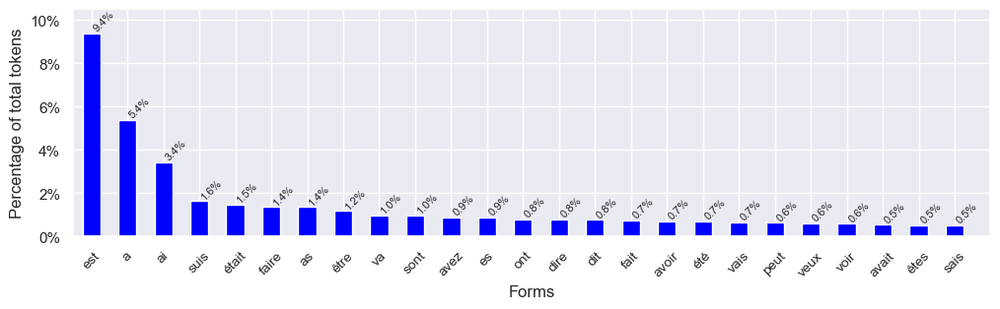

In [524]:
xlim=25
sns.set(font_scale=1)
dfZipf=dfVLTotal[["orth_form","frequency"]].sort_values("frequency",ascending=False).iloc[:xlim].set_index("orth_form")
dfZipf["percentage"]=dfZipf.frequency/occurrencesTotal
dfZipf=dfZipf[["percentage"]]

ax=dfZipf.plot(kind="bar",figsize=(12,3),color="blue")
# labels=[f'{f}$_{{{i+1}}}$' for i,f in enumerate(dfZipf.index)]
labels=[f'{f}' for i,f in enumerate(dfZipf.index)]

plt.xticks(range(xlim))
ax.set_xticklabels(labels,fontsize=10)
# ax.set_yticklabels([])
ax.set_xlim([-0.5,xlim])
ax.set_ylim([0,0.105])
ax.tick_params(axis='x', labelrotation=45)
# ax.set_yscale('log')
for i in range(xlim):
    # xytext introduces a slight offset so the text doesn't sit directly on the marker
    plt.text(i, dfZipf.iloc[i], f'{dfZipf.iloc[i].values[0]:.1%}', ha='left', va='bottom', fontsize=8,rotation=45)

# 4. Display the plot
# plt.title("Form frequency by frequency rank")
plt.xlabel("Forms")
plt.ylabel("Percentage of total tokens")
ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1.0, decimals=0))
ax.get_legend().remove()
plt.savefig(rep+"Vlexique2-Zipf.png",dpi=300,bbox_inches="tight")

In [10]:
dfVide=dfVLTotal.loc[(dfVLTotal.frequency==0)&(dfVLTotal.overabundance_tag.isnull())]
dfSimple=dfVLTotal.loc[(dfVLTotal.frequency>0)&(dfVLTotal.overabundance_tag.isnull())]
dfPivot=pd.pivot(dfSimple,index="lexeme",columns="cell",values="phon_form")
dfPivot.rename(columns=dSwim,inplace=True)
dfCountCells=pd.DataFrame(dfPivot[cellOrd].count())
dfCountCells.columns=["nb attested forms"]

In [526]:
dfPivot.loc[dfPivot.index=="être"].T

lexeme,être
cell,
pc1P,səʁjɔ̃
pc1S,səʁE
pc2P,səʁje
pc2S,səʁE
pc3P,səʁE
pc3S,səʁE
pI1P,swajɔ̃
pI2P,swaje
pI2S,swa


### Fréquence des cases pour les tokens et pour les types

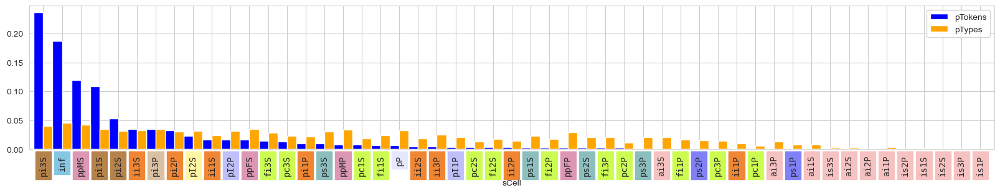

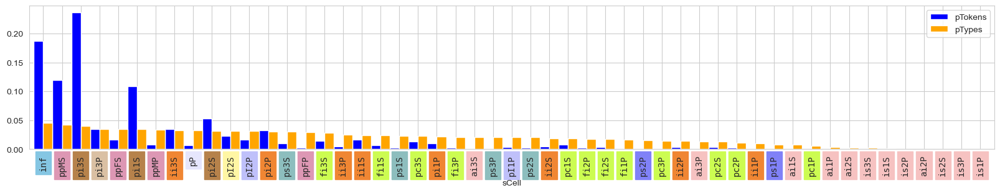

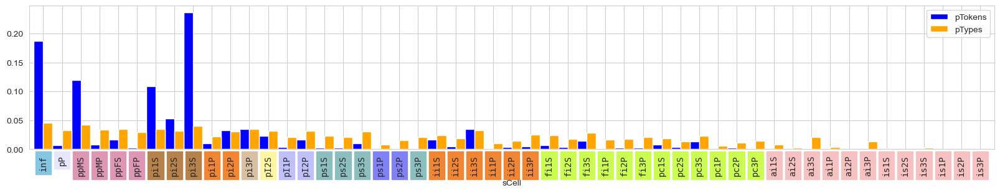

In [17]:
dfCellTokens=dfSimple.groupby("sCell").sum()[["frequency"]]
dfCellTokens["pTokens"]=dfCellTokens.frequency/dfCellTokens.sum()["frequency"]
dfCellTypes=dfSimple.groupby("sCell").count()[["frequency"]]
dfCellTypes["pTypes"]=dfCellTypes.frequency/dfCellTypes.sum()["frequency"]
dfCellFreqs=pd.concat([dfCellTokens[["pTokens"]],dfCellTypes[["pTypes"]]],axis=1)
dfCellFreqs#["pTokens"]
ax=dfCellFreqs.sort_values("pTokens",ascending=False).plot(kind="bar",figsize=(20,3),width=1,color=["blue","orange"])
colorerXTicks(ax,fSize=12)
plt.savefig(rep+"Cases-Frequence-Theorique-TokenType-Token.png",dpi=300,bbox_inches="tight")
ax=dfCellFreqs.sort_values("pTypes",ascending=False).plot(kind="bar",figsize=(20,3),width=1,color=["blue","orange"])
colorerXTicks(ax,fSize=12)
plt.savefig(rep+"Cases-Frequence-Theorique-TokenType-Type.png",dpi=300,bbox_inches="tight")
ax=dfCellFreqs.reindex(cellOrd).plot(kind="bar",figsize=(20,3),width=1,color=["blue","orange"])
colorerXTicks(ax,fSize=12)
plt.savefig(rep+"Cases-Frequence-Theorique-TokenType-StemSpace.png",dpi=300,bbox_inches="tight")

In [25]:
print(dfCellTypes.sort_values("pTypes",ascending=False).reset_index()['sCell'].to_latex())

\begin{tabular}{ll}
\toprule
 & sCell \\
\midrule
0 & inf \\
1 & ppMS \\
2 & pi3S \\
3 & pi3P \\
4 & ppFS \\
5 & pi1S \\
6 & ppMP \\
7 & ii3S \\
8 & pP \\
9 & pi2S \\
10 & pI2S \\
11 & pI2P \\
12 & pi2P \\
13 & ps3S \\
14 & ppFP \\
15 & fi3S \\
16 & ii3P \\
17 & ii1S \\
18 & fi1S \\
19 & ps1S \\
20 & pc3S \\
21 & pi1P \\
22 & fi3P \\
23 & ai3S \\
24 & ps3P \\
25 & pI1P \\
26 & ps2S \\
27 & ii2S \\
28 & pc1S \\
29 & fi2P \\
30 & fi2S \\
31 & fi1P \\
32 & ps2P \\
33 & pc3P \\
34 & ii2P \\
35 & ai3P \\
36 & pc2S \\
37 & pc2P \\
38 & ii1P \\
39 & ps1P \\
40 & ai1S \\
41 & pc1P \\
42 & ai1P \\
43 & ai2S \\
44 & is3S \\
45 & is1S \\
46 & is2P \\
47 & ai2P \\
48 & is2S \\
49 & is3P \\
50 & is1P \\
\bottomrule
\end{tabular}



### Calculs dans l'attesté : formes pour l'imparfait du subjonctif
- calul du nombre de formes liées aux verbes du deuxième groupe

In [117]:
dAttestePersIS={}
casesIS=["is%d%s"%(n+1,p) for p in "SP" for n in range(3)]
print(casesIS)
attesteIS=dfPivot.loc[:,casesIS].dropna(thresh=1).index.tolist()
boolG2=(dfPivot.index.str.endswith("ir"))&dfPivot.pP.str.endswith("isɑ̃")
dAttestePersIS["G2"]=dfPivot.loc[(dfPivot.index.isin(attesteIS))&boolG2].loc[:,casesIS].count().to_dict()
dAttestePersIS["Global"]=dfPivot.loc[(dfPivot.index.isin(attesteIS))].loc[:,casesIS].count().to_dict()
dfAttesteIS=pd.DataFrame(dAttestePersIS)
dfAttesteIS.loc["Total"]=dfAttesteIS.sum()
dfAttesteIS["%G2"]=dfAttesteIS.G2/dfAttesteIS.Global
dfAttesteIS.columns.name = "Attesté"
dfAttesteIS.style.format({'G2': "{:.0f}",'Global': "{:.0f}",'%G2': "{:.2%}"})
# dfAttesteIS

['is1S', 'is2S', 'is3S', 'is1P', 'is2P', 'is3P']


Attesté,G2,Global,%G2
is1S,57,86,66.28%
is2S,46,57,80.70%
is3S,7,239,2.93%
is1P,32,42,76.19%
is2P,64,81,79.01%
is3P,25,52,48.08%
Total,231,557,41.47%


### Tables de probabilités pour les fréquences Cin-Cout

#### par nombre de tokens par case

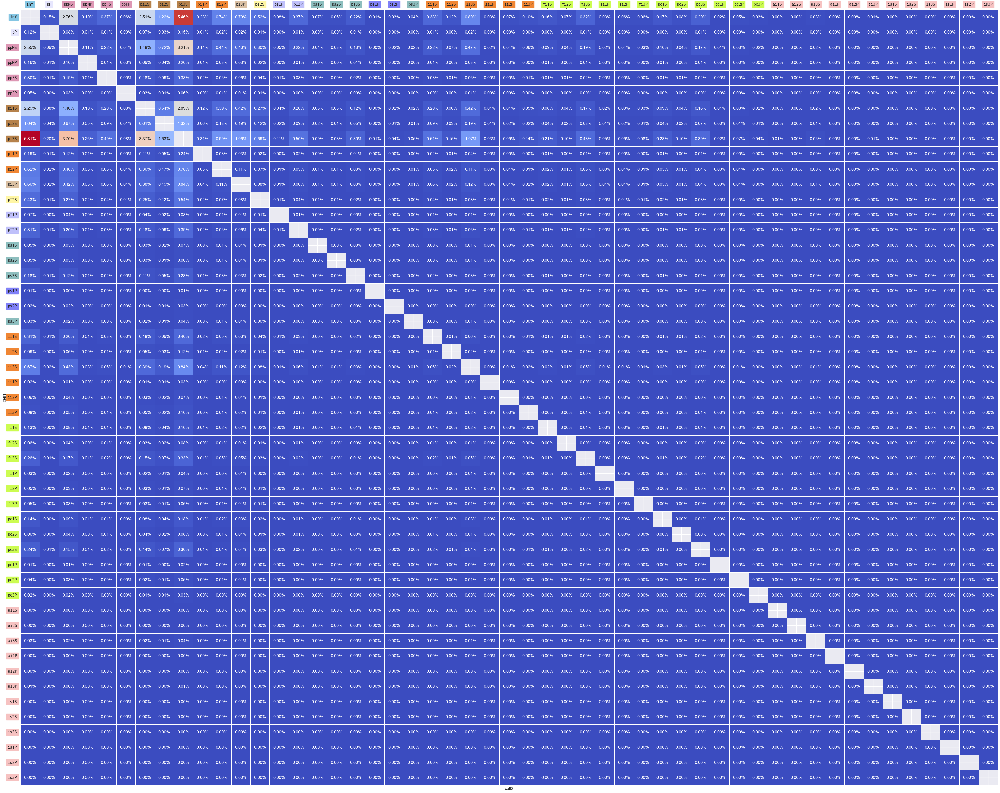

In [635]:
pTokens=[]
for c1 in cellOrd:
    p1=dfCellTokens.pTokens[c1]
    for c2 in cellOrd:
        if c2!=c1:
            p2=dfCellTokens.frequency[c2]/dfCellTokens.loc[dfCellTokens.index!=c1].sum()["frequency"]
            pTokens.append([c1,c2,p1*p2])

dfPTokens=pd.DataFrame(pTokens)
dfPTokens.columns=["cell1","cell2","prob"]
dfPivotPTokens=pd.pivot(dfPTokens,index="cell1",columns="cell2",values="prob").reindex(cellOrd)
for c in cellOrd:
    if c not in dfPivotPTokens:
        dfPivotPTokens[c]=np.nan
dfPivotPTokens=dfPivotPTokens[cellOrd]
dfPivotPTokens

%store -r pltCellColors
sns.set_style("white")
sns.set(rc={'figure.figsize':(50,40)})
ax=sns.heatmap(dfPivotPTokens,annot=True,linewidth=.5,cmap="coolwarm",fmt=".2%",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=24)
colorerYTicks(ax,fSize=24)
plt.savefig(rep+"CasesPaires-Frequence-Theorique-Token.png",dpi=300,bbox_inches="tight")

#### par nombre de types par case

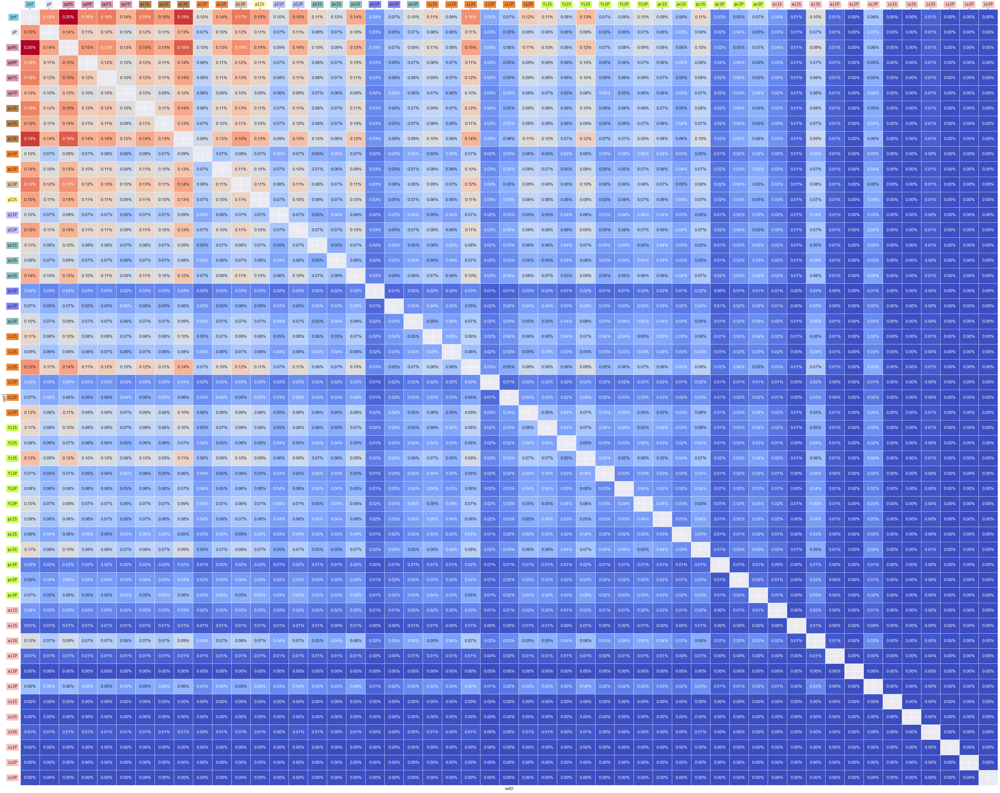

In [634]:
pTypes=[]
for c1 in cellOrd:
    p1=dfCellTypes.pTypes[c1]
    for c2 in cellOrd:
        if c2!=c1:
            p2=dfCellTypes.frequency[c2]/dfCellTypes.loc[dfCellTypes.index!=c1].sum()["frequency"]
            pTypes.append([c1,c2,p1*p2])

dfPTypes=pd.DataFrame(pTypes)
dfPTypes.columns=["cell1","cell2","prob"]
dfPivotPTypes=pd.pivot(dfPTypes,index="cell1",columns="cell2",values="prob").reindex(cellOrd)
for c in cellOrd:
    if c not in dfPivotPTypes:
        dfPivotPTypes[c]=np.nan
dfPivotPTypes=dfPivotPTypes[cellOrd]
dfPivotPTypes

%store -r pltCellColors
sns.set_style("white")
sns.set(rc={'figure.figsize':(50,40)})
ax=sns.heatmap(dfPivotPTypes,annot=True,linewidth=.5,cmap="coolwarm",fmt=".2%",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=24)
colorerYTicks(ax,fSize=24)
plt.savefig(rep+"CasesPaires-Frequence-Theorique-Type.png",dpi=300,bbox_inches="tight")

#### Nombres de paires pour les paires de cases Cin-Cout avec les deux formes les plus fréquentes de chaque verbe

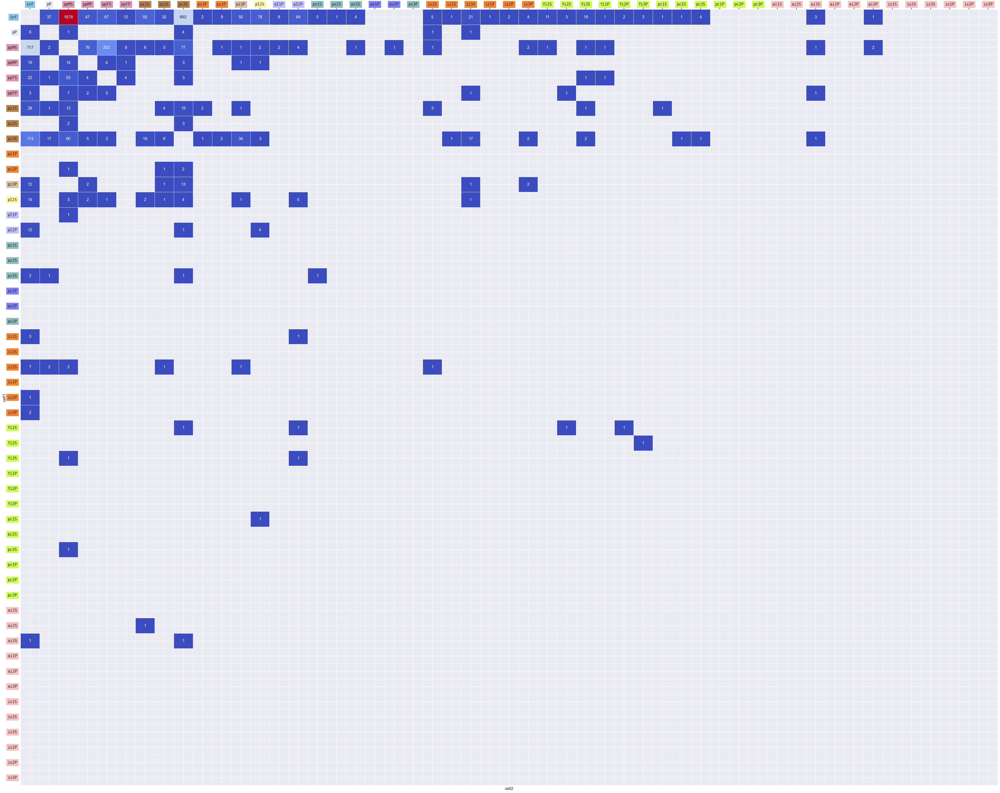

In [616]:
def extractMaxCells(df):
    d=df.T.apply(lambda x: x.nlargest(2)).to_dict()
    max2={}
    pairs={}
    for k,v in d.items():
        if k not in max2:
            max2[k]=[]
        for kk,vv in v.items():
            if vv==vv:
                max2[k].append([kk,vv])
        pairs[k]=tuple([x for x, y in sorted(max2[k],key=lambda x: x[1],reverse=True)])
        # print(pairs[k])
    return max2, pairs
dfCellsPivot=pd.pivot(dfSimple,index="lexeme",columns="sCell",values="frequency")
dCell2Max,dCellMaxPairs=extractMaxCells(dfCellsPivot)
# print(dCellMaxPairs)
dPairsNb={}
for k,v in dCellMaxPairs.items():
    # print(v)
    if v not in dPairsNb:
        dPairsNb[v]=0
    dPairsNb[v]+=1
# dPairsNb
[[k[0],k[1],v] for k,v in dPairsNb.items() if len(k)==2]
dfMax2Pairs=pd.DataFrame([[k[0],k[1],v] for k,v in dPairsNb.items() if len(k)==2])
dfMax2Pairs.columns=["cell1","cell2","nb"]
dfPivotMax2=pd.pivot(dfMax2Pairs,index="cell1",columns="cell2",values="nb").reindex(cellOrd)
for c in cellOrd:
    if c not in dfPivotMax2:
        dfPivotMax2[c]=np.nan
dfPivotMax2=dfPivotMax2[cellOrd]
dfPivotMax2

%store -r pltCellColors
sns.set_style("white")
sns.set(rc={'figure.figsize':(50,40)})
ax=sns.heatmap(dfPivotMax2,annot=True,linewidth=.5,cmap="coolwarm",fmt=".0f",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=12)
colorerYTicks(ax,fSize=12)
plt.savefig(rep+"Cooccurrences-VL2-2MostFrequent.png",dpi=300,bbox_inches="tight")

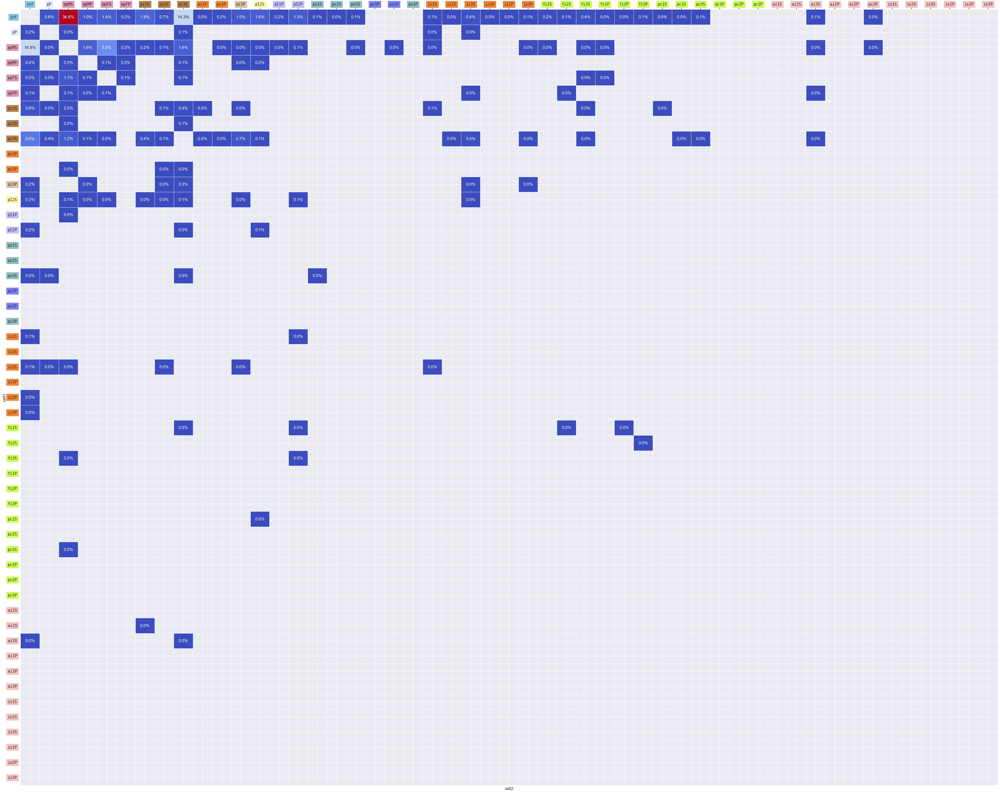

In [617]:
ax=sns.heatmap(dfPivotMax2/dfPivotMax2.sum().sum(),annot=True,linewidth=.5,cmap="coolwarm",fmt=".1%",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=12)
colorerYTicks(ax,fSize=12)

### Fréquences des cases par type

In [8]:
dfCountCells

NameError: name 'dfCountCells' is not defined

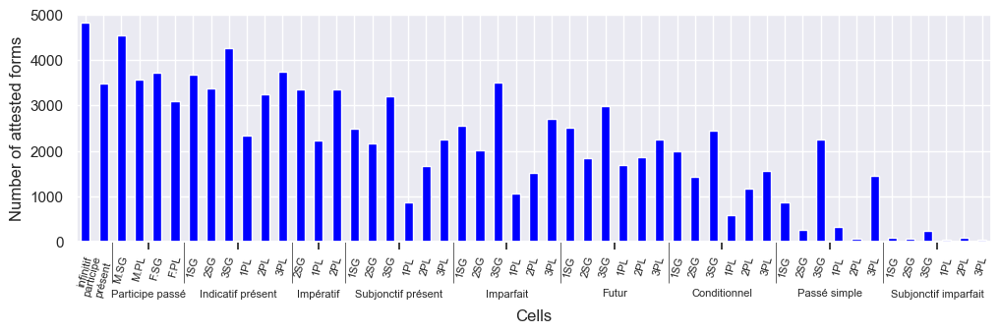

In [529]:
ax=dfCountCells.plot(kind="bar",figsize=(12,3),color="blue")
labels = ["infinitif","participe\nprésent\n", "M.SG","M.PL","F.SG","F.PL","1SG","2SG","3SG","1PL","2PL","3PL","2SG","1PL","2PL","1SG","2SG","3SG","1PL","2PL","3PL","1SG","2SG","3SG","1PL","2PL","3PL","1SG","2SG","3SG","1PL","2PL","3PL","1SG","2SG","3SG","1PL","2PL","3PL","1SG","2SG","3SG","1PL","2PL","3PL","1SG","2SG","3SG","1PL","2PL","3PL",]
ax.set_xticklabels(labels,fontsize=8)
ax.tick_params(axis='x', labelrotation=75)
sec = ax.secondary_xaxis(location=0)
sec.set_xticks([3.5, 8.5, 13, 17.5, 23.5, 29.5, 35.5, 41.5, 47.5], labels=['\n\n\nParticipe passé', '\n\n\nIndicatif présent', '\n\n\nImpératif', 
                                       '\n\n\nSubjonctif présent', '\n\n\nImparfait', '\n\n\nFutur', '\n\n\nConditionnel', 
                                       '\n\n\nPassé simple', '\n\n\nSubjonctif imparfait'],fontsize=8)
sec2 = ax.secondary_xaxis(location=0)
sec2.set_xticks([1.5, 5.5, 11.5,14.5,20.5,26.5,32.5,38.5,44.5], labels=[])
sec2.tick_params('x', length=30, width=0.5)
ax.set_xlabel("Cells")
ax.set_ylabel("Number of attested forms")
ax.set_ylim(0,5000)
ax.get_legend().remove()
plt.savefig(rep+"Distribution-Cells.png",dpi=300,bbox_inches="tight")

#### Fréquence du nombre de formes par lexème

In [289]:
dfSimple["frequency"].median()

8.0

In [290]:
dfCountCells.loc[dfCountCells["nb attested forms"]<=500].count()

nb attested forms    9
dtype: int64

In [291]:
dfSimple.groupby("lexeme").count()["cell"].mean()

21.24046104928458

In [292]:
dfCount=dfSimple.groupby("lexeme").count()[["cell","frequency"]]
dfCount.columns=["nb of lexemes","nb of forms"]
dfCount.sort_values(by="nb of forms")[:190]

,nb of lexemes,nb of forms
lexeme,,
pleuviner,1,1
apurer,1,1
ardre,1,1
comparoir,1,1
démuseler,1,1
...,...,...
helléniser,1,1
déraidir,2,2
trépider,2,2


In [293]:
dfCount[dfCount["nb of forms"]==21]

,nb of lexemes,nb of forms
lexeme,,
abréger,21,21
actualiser,21,21
aduler,21,21
affaisser,21,21
affluer,21,21
...,...,...
zieuter,21,21
édifier,21,21
émietter,21,21


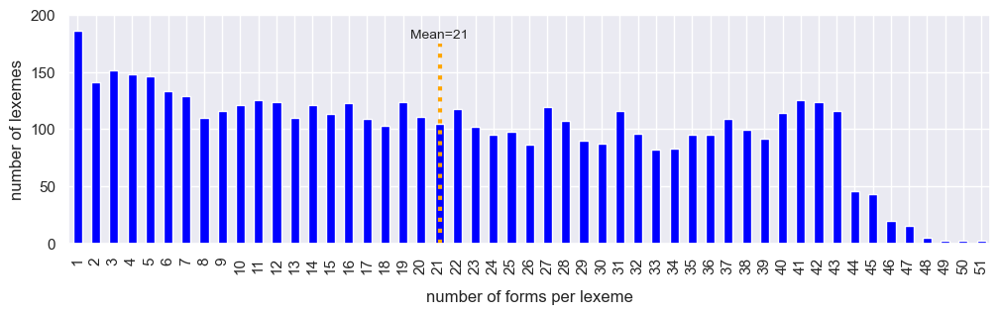

In [294]:
ax=dfCount.groupby("nb of forms").count().plot(kind="bar",figsize=(12,3),color="blue")
# ax.set_title("Nb of lexemes per nb of attested forms")
ax.set_xlim(-0.5,50.5)
ax.set_xlabel("number of forms per lexeme")
ax.xaxis.set_label_coords(0.5, -0.2)
ax.set_ylim(0,200)
ax.set_ylabel("number of lexemes")
ax.set_xticks(range(0,51))
ax.get_legend().remove()
plt.plot([20.05, 20.05], [0, 175], lw=3, linestyle=":", color="orange")
plt.text(20, 180, 'Mean=21', fontsize=10,ha="center")
plt.savefig(rep+"Distribution-FormsLexemes.png",dpi=300,bbox_inches="tight")

### Attestées sans infinitif/participe passé/présent3

In [533]:
def filterDictNa(df):
    result={}
    for k,v in df.items():
        result[k]={kk:vv for kk,vv in v.items() if vv==vv}
        # print(k,result[k])

    print(len(result))
    return 

In [454]:
ppNo=(dfPivot.ppMS.isnull())&(dfPivot.ppMP.isnull())&(dfPivot.ppFS.isnull())&(dfPivot.ppFP.isnull())
infNo=(dfPivot.inf.isnull())
pi3SNo=(dfPivot.pi3S.isnull())
ppMSNo=(dfPivot.ppMS.isnull())
filterDictNa(dfPivot.loc[pi3SNo].T)
filterDictNa(dfPivot.loc[pi3SNo&infNo].T)
filterDictNa(dfPivot.loc[pi3SNo&ppMSNo&infNo].T)
filterDictNa(dfPivot.loc[pi3SNo&ppNo&infNo].T)
filterDictNa(dfPivot.loc[infNo].T)
filterDictNa(dfPivot.loc[ppMSNo&infNo].T)
filterDictNa(dfPivot.loc[ppNo&infNo].T)
filterDictNa(dfPivot.loc[ppMSNo].T)
filterDictNa(dfPivot.loc[ppNo].T)


a=1

764
134
67
51
203
107
85
486
376


# Distributions par temps et par personne

In [159]:
dTiroir={"in":"Infinitif","pP":"Participe présent",
         "pp":"Participe passé","pi":"Indicatif présent",
         "pI":"Impératif","ps":"Subjonctif présent",
         "ii":"Imparfait","fi":"Futur","pc":"Conditionnel",
         "ai":"Passé simple","is":"Subjonctif imparfait"}
dNbTiroir={"Infinitif":1, "Participe présent":1, "Participe passé":4, "Indicatif présent":6, "Impératif":3, "Subjonctif présent":6, "Imparfait":6, "Futur":6, "Conditionnel":6, "Passé simple":6, "Subjonctif imparfait":6}
lTiroir=list(dTiroir.values())

dPers={"1S":"1SG","2S":"2SG","3S":"3SG",
       "1P":"1PL","2P":"2PL","3P":"3PL",
       "f":np.NaN,"":np.NaN,"MS":np.NaN,"MP":np.NaN,"FS":np.NaN,"FP":np.NaN,}
lPers=list(dPers.values())

In [296]:
dfCountCells["Subparadigm"]=dfCountCells.index.str[:2]
dfCountCells["Subparadigm"]=dfCountCells.Subparadigm.replace(dTiroir)
dfCountCells["pers"]=dfCountCells.index.str[2:]
dfCountCells["pers"]=dfCountCells["pers"].replace(dPers)
# dfCountCells

In [297]:
dfVides=dfVide.loc[dfVide.form_id.str[-1]!="2"]

In [298]:
dfVidePivot=pd.pivot(dfVides,index="lexeme",columns="cell",values="phon_form")
dfVidePivot.rename(columns=dSwim,inplace=True)

In [299]:
dfCountVide=pd.DataFrame(dfVidePivot[cellOrd].count())
dfCountVide.columns=["nb non-attested forms"]
# dfCountVideT

In [300]:
dfCountVide["Subparadigm"]=dfCountVide.index.str[:2]
dfCountVide["Subparadigm"]=dfCountVide.Subparadigm.replace(dTiroir)
dfCountVide["pers"]=dfCountVide.index.str[2:]
dfCountVide["pers"]=dfCountVide.pers.replace(dPers)

## Distribution par temps

In [301]:
dfSubT=dfCountCells[["nb attested forms","Subparadigm"]].groupby("Subparadigm").sum()
dfSubT.reindex(lTiroir)

,nb attested forms
Subparadigm,
Infinitif,4829
Participe présent,3483
Participe passé,14927
Indicatif présent,20647
Impératif,8928
Subjonctif présent,12608
Imparfait,13360
Futur,13144
Conditionnel,9194


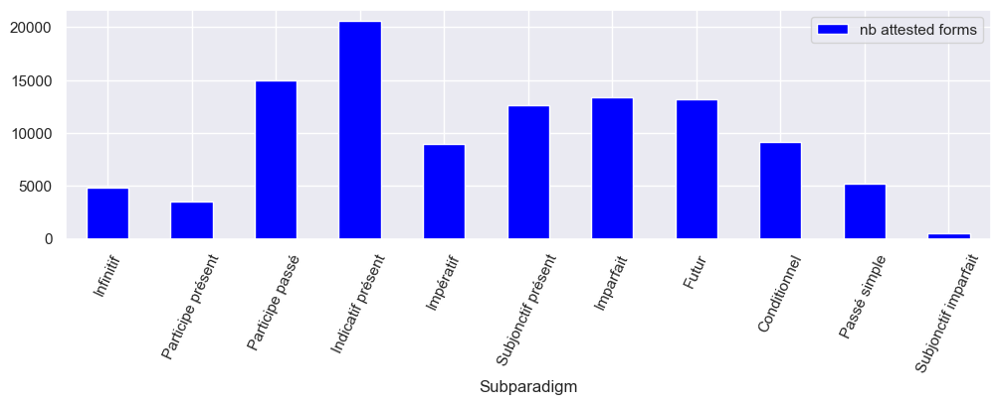

In [302]:
ax=dfSubT.reindex(lTiroir).plot(kind="bar",figsize=(12,3),color="blue")
ax.tick_params(axis='x', labelrotation=65)

In [303]:
dfSubVideT=dfCountVide[["nb non-attested forms","Subparadigm"]].groupby("Subparadigm").sum()
# dfSubVideT.reindex(lTiroir)

In [304]:
dfPleinVideT=pd.DataFrame({"attested":dfSubT["nb attested forms"],
              "non-attested":dfSubVideT["nb non-attested forms"]}).reindex(lTiroir)
dfPleinVideT["total"]=dfPleinVideT["attested"]+dfPleinVideT["non-attested"]
dfPleinVideT["coverage"]=(round(dfPleinVideT["attested"]/dfPleinVideT["total"]*100,0)).astype(int).astype(str)+"%"
dfPleinVideT

,attested,non-attested,total,coverage
Subparadigm,,,,
Infinitif,4829,444,5273,92%
Participe présent,3483,1750,5233,67%
Participe passé,14927,6097,21024,71%
Indicatif présent,20647,10444,31091,66%
Impératif,8928,6683,15611,57%
Subjonctif présent,12608,18488,31096,41%
Imparfait,13360,18028,31388,43%
Futur,13144,16551,29695,44%
Conditionnel,9194,20495,29689,31%


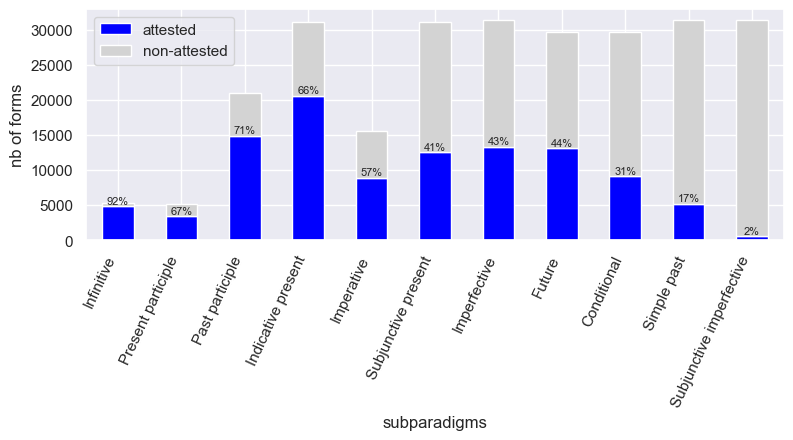

In [305]:
ax=pd.DataFrame({"attested":dfSubT["nb attested forms"],
              "non-attested":dfSubVideT["nb non-attested forms"]}).reindex(lTiroir).plot.bar(stacked=True,figsize=(9,3),color=["blue","lightgray",])
ax.set_xlabel("subparadigms")
ax.set_ylabel("nb of forms")
ax.set_xticklabels(tenseLabels,rotation=65,ha="right")

covLabels=dfPleinVideT["coverage"].tolist()
rects=ax.patches[:11]
for rect, label in zip(rects, covLabels):
    height=rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom", fontsize=8
    )
plt.savefig(rep+"Distribution-FormsTenses.png",dpi=300,bbox_inches="tight")

## Distribution par personne

In [306]:
dfSubP=dfCountCells[["nb attested forms","pers"]].groupby("pers").sum()
dfSubP=dfSubP.reindex(lPers).dropna()

In [307]:
dfSubVideP=dfCountVide[["nb non-attested forms","pers"]].groupby("pers").sum()
dfSubVideP=dfSubVideP.reindex(lPers).dropna()

In [308]:
dfPleinVideP=pd.DataFrame({"attested":dfSubP["nb attested forms"],
              "non-attested":dfSubVideP["nb non-attested forms"]})
dfPleinVideP["total"]=dfPleinVideP["attested"]+dfPleinVideP["non-attested"]
dfPleinVideP["coverage"]=round(dfPleinVideP["attested"]/dfPleinVideP["total"]*100).astype(int).astype(str)+"%"
dfPleinVideP

,attested,non-attested,total,coverage
pers,,,,
1SG,14188.0,21729.0,35917.0,40%
2SG,14483.0,26596.0,41079.0,35%
3SG,18887.0,17005.0,35892.0,53%
1PL,9136.0,32153.0,41289.0,22%
2PL,12940.0,28324.0,41264.0,31%
3PL,14009.0,21916.0,35925.0,39%


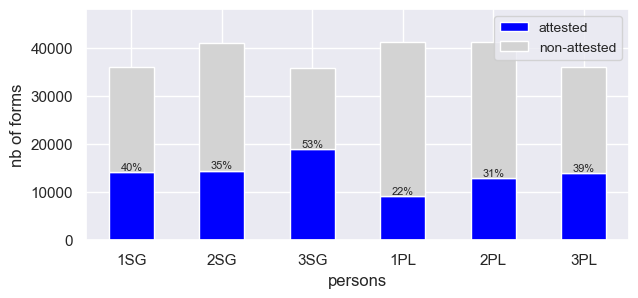

In [309]:
ax=pd.DataFrame({"attested":dfSubP["nb attested forms"],
              "non-attested":dfSubVideP["nb non-attested forms"]}).plot.bar(stacked=True,figsize=(7,3),color=["blue","lightgray",])
ax.set_xlabel("persons")
ax.set_ylabel("nb of forms")
ax.set_ylim(0,48000)
ax.tick_params(axis='x', labelrotation=0)
plt.legend(
    # bbox_to_anchor=(1.0, 1.0),
    fontsize='small',)


covLabels=dfPleinVideP["coverage"].tolist()

rects=ax.patches
for rect, label in zip(rects, covLabels):
    height=rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom", fontsize=8
    )


plt.savefig(rep+"Distribution-FormsPersons.png",dpi=300,bbox_inches="tight")

# Calculs sur l'attesté

In [310]:
# Define the colormap
colors = [(1, 0, 0), (1, 1, 1), (0, 1, 0)]  # Red -> White -> Green
n_bins = 5  # Discretize the interpolation into bins
cmap_name = 'red_green'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

#### Heatmap temps/personnes

In [150]:
dPersCase={"%d%s"%(p+1,n):[c for c in cellOrd if "%d%s"%(p+1,n) in c] for n in "SP" for p in range(3) }
dPersCase

{'1S': ['pi1S', 'ps1S', 'ii1S', 'fi1S', 'pc1S', 'ai1S', 'is1S'],
 '2S': ['pi2S', 'pI2S', 'ps2S', 'ii2S', 'fi2S', 'pc2S', 'ai2S', 'is2S'],
 '3S': ['pi3S', 'ps3S', 'ii3S', 'fi3S', 'pc3S', 'ai3S', 'is3S'],
 '1P': ['pi1P', 'pI1P', 'ps1P', 'ii1P', 'fi1P', 'pc1P', 'ai1P', 'is1P'],
 '2P': ['pi2P', 'pI2P', 'ps2P', 'ii2P', 'fi2P', 'pc2P', 'ai2P', 'is2P'],
 '3P': ['pi3P', 'ps3P', 'ii3P', 'fi3P', 'pc3P', 'ai3P', 'is3P']}

In [175]:
persTempsCounts={}
cellCounts=dfPivot[cellOrd].count().to_dict()
for k,v in dPersCase.items():
    pk=persTempsCounts[k]={}
    for t in v:
        pk[dTiroir[t[:2]]]=cellCounts[t]
dfPersTemps=pd.DataFrame(persTempsCounts).T
dfPersTemps=dfPersTemps[[t for t in lTiroir if t in dfPersTemps.columns]]
dfPersTemps

,Indicatif présent,Impératif,Subjonctif présent,Imparfait,Futur,Conditionnel,Passé simple,Subjonctif imparfait
1S,3685.0,NaN,2478.0,2563.0,2520.0,1995.0,861.0,86.0
2S,3370.0,3352.0,2163.0,2007.0,1837.0,1436.0,261.0,57.0
3S,4268.0,NaN,3192.0,3508.0,2982.0,2448.0,2250.0,239.0
1P,2333.0,2228.0,873.0,1057.0,1693.0,593.0,317.0,42.0
2P,3248.0,3348.0,1662.0,1524.0,1862.0,1157.0,58.0,81.0
3P,3743.0,NaN,2240.0,2701.0,2250.0,1565.0,1458.0,52.0


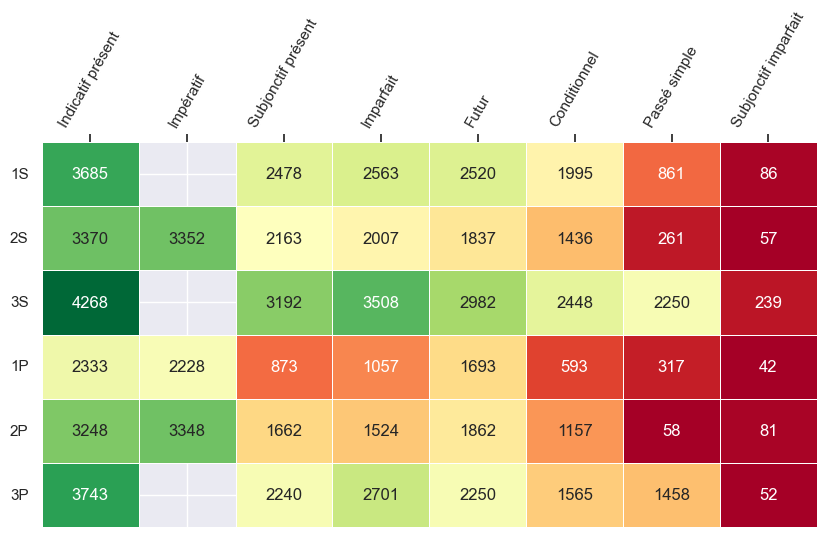

In [174]:
sns.set(rc={'figure.figsize':(10,5)})
ax=sns.heatmap(dfPersTemps,annot=True,linewidth=.5,cmap="RdYlGn",fmt=".0f",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)

## Non Coformes dans l’attesté

In [220]:
noncoforms={}
for c1 in cellOrd:
    # print(c1)
    if c1 not in noncoforms:
        noncoforms[c1]={}
    for c2 in cellOrd:
        # print(c2)
        noncoforms[c1][c2]=dfPivot[(dfPivot[c1].notnull())][c2].isna().sum()
dfNoncoforms=pd.DataFrame(noncoforms).T
dfNoncoforms

,inf,pP,ppMS,ppMP,ppFS,ppFP,pi1S,pi2S,pi3S,pi1P,...,ai3S,ai1P,ai2P,ai3P,is1S,is2S,is3S,is1P,is2P,is3P
inf,0,1365,379,1297,1159,1769,1167,1468,630,2502,...,2583,4512,4771,3372,4743,4772,4590,4788,4748,4777
pP,19,0,64,585,519,876,377,539,129,1267,...,1374,3173,3426,2068,3400,3427,3248,3443,3403,3433
ppMS,96,1127,0,1026,897,1496,954,1235,457,2231,...,2312,4230,4488,3095,4460,4489,4308,4505,4466,4494
ppMP,47,681,59,0,250,671,587,806,266,1484,...,1568,3274,3523,2219,3500,3524,3348,3540,3504,3531
ppFS,46,752,67,387,0,754,637,861,293,1594,...,1656,3412,3658,2352,3638,3661,3486,3676,3643,3668
ppFP,26,479,36,178,124,0,445,603,185,1162,...,1223,2794,3031,1799,3013,3035,2864,3048,3016,3040
pi1S,23,579,93,693,606,1044,0,534,130,1465,...,1580,3373,3627,2302,3601,3629,3452,3645,3606,3635
pi2S,9,426,59,597,515,887,219,0,80,1254,...,1330,3065,3312,2013,3287,3315,3138,3329,3291,3319
pi3S,69,914,179,955,845,1367,713,978,0,1987,...,2078,3956,4210,2843,4185,4212,4034,4227,4189,4218
pi1P,6,117,18,238,211,409,113,217,52,0,...,607,2033,2277,1090,2257,2280,2105,2293,2259,2283


In [227]:
dNonCoTemps={}
for t,temps in dTiroir.items():
    dNonCoTemps[temps]={}
    dNonCoforms={}
    colsTemps=[c for c in dfNoncoforms.columns if t in c]
    dNonCoforms[temps]=dfNoncoforms[colsTemps].T.sum()
    for tt,ttemps in dTiroir.items():
        colsTTemps=[c for c in dfNoncoforms.columns if tt in c]
        dNonCoTemps[temps][ttemps]=int(dNonCoforms[temps][colsTTemps].sum()/(dNbTiroir[temps]*dNbTiroir[ttemps]))
dfNonCoTemps=pd.DataFrame(dNonCoTemps)
dfNonCoTemps

,Infinitif,Participe présent,Participe passé,Indicatif présent,Impératif,Subjonctif présent,Imparfait,Futur,Conditionnel,Passé simple,Subjonctif imparfait
Infinitif,0,1365,1151,1411,1868,2731,2608,2641,3298,3962,4736
Participe présent,19,0,511,529,865,1526,1404,1446,2020,2654,3392
Participe passé,53,759,371,828,1133,1832,1786,1750,2315,2929,3644
Indicatif présent,23,487,537,472,863,1510,1426,1435,2001,2633,3351
Impératif,15,358,378,398,420,1167,1135,1099,1616,2209,2889
Subjonctif présent,4,144,201,170,293,547,612,579,935,1445,2019
Imparfait,6,148,281,212,385,737,575,699,1061,1562,2147
Futur,3,154,209,184,314,669,663,440,925,1509,2106
Conditionnel,1,69,116,92,173,366,367,267,453,982,1456
Passé simple,1,38,64,60,100,212,203,185,317,466,815


Text(92.24999999999999, 0.5, 'Prédicteurs')

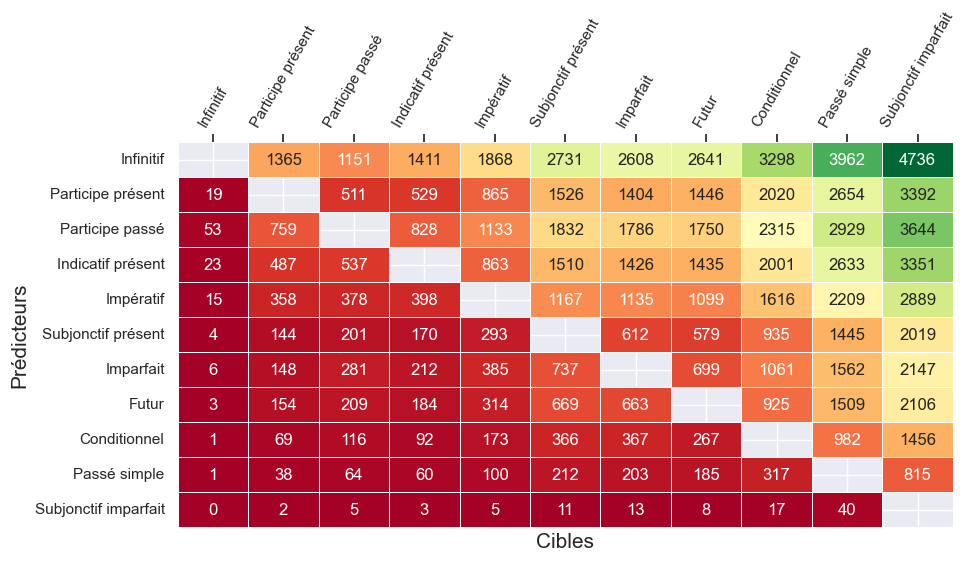

In [226]:
mask=np.full_like(dfNonCoTemps, False, dtype=bool)
for i in range(11):
    mask[i,i]=True
sns.set(rc={'figure.figsize':(10,5)})
ax=sns.heatmap(dfNonCoTemps,mask=mask,annot=True,linewidth=.5,cmap="RdYlGn",fmt=".0f",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='x', labelrotation=60)
plt.xlabel("Cibles", fontsize = 15)
plt.ylabel("Prédicteurs", fontsize = 15)


## Coformes dans l'attesté

In [311]:
coforms={}
for c1 in cellOrd:
    if c1 not in coforms:
        coforms[c1]={}
    for c2 in cellOrd:
        coforms[c1][c2]=dfPivot[(dfPivot[c1].notnull())&(dfPivot[c2].notnull())][c2].count()

In [312]:
dfCoforms=pd.DataFrame(coforms)

In [12]:
def colorerXTicks(gAX,fSize=12):
    xlabels=gAX.get_xticklabels()
    for xlabel in xlabels:
        xtext=xlabel.get_text()
        xlabel.set_backgroundcolor(pltCellColors[xtext])
        xlabel.set_family("monospace")
        
def colorerYTicks(gAX,fSize=12):
    ylabels=gAX.get_yticklabels()
    for ylabel in ylabels:
        ytext=ylabel.get_text()
        ylabel.set_backgroundcolor(pltCellColors[ytext])
        ylabel.set_family("monospace")

### Paradigm Heatmap

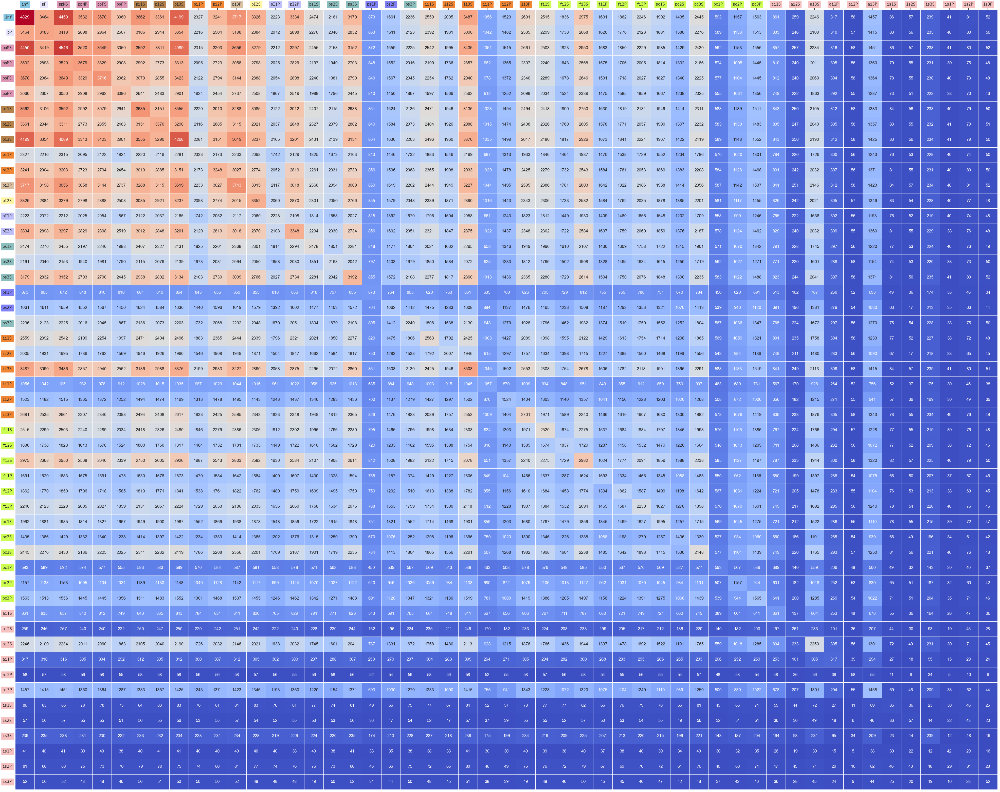

In [314]:
%store -r pltCellColors
sns.set_style("white")
sns.set(rc={'figure.figsize':(50,40)})
ax=sns.heatmap(dfCoforms,annot=True,linewidth=.5,cmap="coolwarm",fmt="d",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=12)
colorerYTicks(ax,fSize=12)

### Subparadigms Heatmap

In [315]:
dfSimple.loc[:,"sCell"]=dfSimple.loc[:,"cell"].replace(dSwim)
dfSimple.loc[:,"Subparadigm"]=dfSimple.sCell.str[:2]
dfSimple.loc[:,"Subparadigm"]=dfSimple.Subparadigm.replace(dTiroir)
dfSimple

dfPivotT=pd.pivot_table(dfSimple[:],index="lexeme",columns="Subparadigm",values="phon_form",aggfunc = len)
dfPivotT

/var/folders/dy/h2nycthd7qjbd6qkb5h8t0nm0000gn/T/ipykernel_20383/4258126388.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfSimple.loc[:,"sCell"]=dfSimple.loc[:,"cell"].replace(dSwim)
/var/folders/dy/h2nycthd7qjbd6qkb5h8t0nm0000gn/T/ipykernel_20383/4258126388.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfSimple.loc[:,"Subparadigm"]=dfSimple.sCell.str[:2]


Subparadigm,Conditionnel,Futur,Imparfait,Impératif,Indicatif présent,Infinitif,Participe passé,Participe présent,Passé simple,Subjonctif imparfait,Subjonctif présent
lexeme,,,,,,,,,,,
abaisser,5.0,6.0,4.0,3.0,6.0,1.0,4.0,1.0,4.0,NaN,5.0
abandonner,6.0,6.0,6.0,3.0,6.0,1.0,4.0,1.0,6.0,NaN,6.0
abasourdir,NaN,1.0,NaN,1.0,2.0,1.0,4.0,NaN,1.0,NaN,1.0
abattre,5.0,6.0,6.0,3.0,6.0,1.0,4.0,1.0,3.0,NaN,6.0
abdiquer,1.0,5.0,3.0,3.0,6.0,1.0,2.0,1.0,1.0,NaN,3.0
...,...,...,...,...,...,...,...,...,...,...,...
éviscérer,NaN,NaN,2.0,1.0,4.0,1.0,4.0,1.0,NaN,NaN,3.0
éviter,6.0,6.0,6.0,3.0,6.0,1.0,4.0,1.0,3.0,NaN,6.0
évoluer,5.0,6.0,5.0,3.0,6.0,1.0,4.0,1.0,2.0,NaN,5.0


In [316]:
coformsT={}
for t1 in lTiroir:
    if t1 not in coformsT:
        coformsT[t1]={}
    for t2 in lTiroir:
        coformsT[t1][t2]=dfPivotT[(dfPivotT[t1].notnull())&(dfPivotT[t2].notnull())][t2].count()
dfCoformsT=pd.DataFrame(coformsT)

In [317]:
dfCoformsT.sum().sum()/51/51/2

63.42695117262592

In [318]:
coformsT={}
for t1 in lTiroir:
    if t1 not in coformsT:
        coformsT[t1]={}
    for t2 in lTiroir:
        coformsT[t1][t2]=int(round(dfPivotT[(dfPivotT[t1].notnull())&(dfPivotT[t2].notnull())][t2].count()/(dNbTiroir[t1]*dNbTiroir[t2])))
dfCoformsT=pd.DataFrame(coformsT)

#### Subparadigm Heatmap avec seuils

In [319]:
cm=["orange",
    "white", "gray", "gray", "gray", "green", 
    "green", "green", "green", "green", "green", 
    "green", "green", "green", "green", "green", 
    "green", "green", "green", "green", "green",
    "green", "green", "green", "green", "green", 
    "green", "green", "green", "green", "green",
    "green", "green", "green", "green", "green", 
    "green", "green", "green", "green", "green", 
    "green", "green", "green", "green", "green",
    "green", "green", "green", "green", "green", 
    "green", "green", "green", "green", "green"]

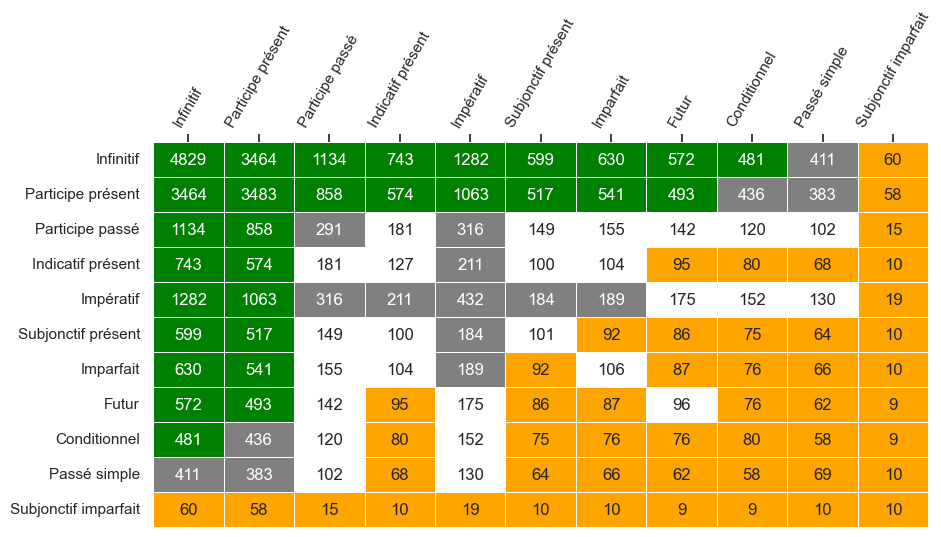

In [320]:
sns.set(rc={'figure.figsize':(10,5)})
ax=sns.heatmap(dfCoformsT,annot=True,linewidth=.5,cmap=cm,fmt="d",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)

#### Subparadigm Heatmap avec gradient

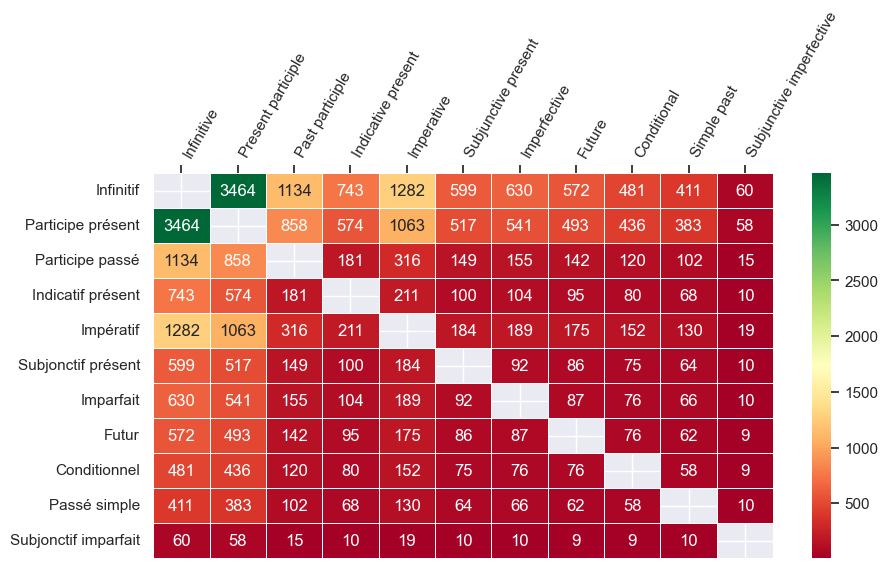

In [321]:
mask=np.full_like(dfCoformsT, False, dtype=bool)
for i in range(11):
    mask[i,i]=True
sns.set(rc={'figure.figsize':(10,5)})
ax=sns.heatmap(dfCoformsT,mask=mask,annot=True,linewidth=.5,cmap='RdYlGn',fmt="d",cbar=True)
ax.xaxis.tick_top()
ax.set_xticklabels(tenseLabels, ha="left")
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)

# Calculs sur Known vs Unknown

In [53]:
dfS4=pd.read_csv(rep+"WordStructure/vlexique2-S4.csv",sep=";").set_index("lexeme")
dfR4=pd.read_csv(rep+"WordStructure/vlexique2-R4.csv",sep=";").set_index("lexeme")

In [65]:
dfS4.columns

Index(['ai1P', 'ai1S', 'ai2P', 'ai2S', 'ai3P', 'ai3S', 'fi1P', 'fi1S', 'fi2P',
       'fi2S', 'fi3P', 'fi3S', 'ii1P', 'ii1S', 'ii2P', 'ii2S', 'ii3P', 'ii3S',
       'inf', 'is1P', 'is1S', 'is2P', 'is2S', 'is3P', 'is3S', 'pI1P', 'pI2P',
       'pI2S', 'pP', 'pc1P', 'pc1S', 'pc2P', 'pc2S', 'pc3P', 'pc3S', 'pi1P',
       'pi1S', 'pi2P', 'pi2S', 'pi3P', 'pi3S', 'ppFP', 'ppFS', 'ppMP', 'ppMS',
       'ps1P', 'ps1S', 'ps2P', 'ps2S', 'ps3P', 'ps3S'],
      dtype='object')

#### Non Coformes entre S4 et non-S4

In [231]:
noncoformsK={}
for c1 in cellOrd:
    # print(c1)
    if c1 not in noncoformsK:
        noncoformsK[c1]={}
    for c2 in cellOrd:
        # print(c2)
        noncoformsK[c1][c2]=dfS4[(dfS4[c1].notnull())][c2].isna().sum()
dfNoncoforms=pd.DataFrame(noncoformsK).T
dfNoncoforms

,inf,pP,ppMS,ppMP,ppFS,ppFP,pi1S,pi2S,pi3S,pi1P,...,ai3S,ai1P,ai2P,ai3P,is1S,is2S,is3S,is1P,is2P,is3P
inf,0,2093,499,1814,1511,2407,1746,2101,774,2996,...,3110,3920,3952,3601,3945,3945,3942,3952,3940,3953
pP,13,0,62,479,404,710,239,362,19,954,...,1081,1840,1872,1530,1865,1865,1862,1872,1860,1873
ppMS,192,1835,0,1448,1120,2076,1476,1829,638,2692,...,2806,3613,3645,3295,3638,3638,3635,3645,3633,3646
ppMP,71,816,12,0,130,710,641,839,219,1384,...,1473,2177,2209,1888,2203,2203,2201,2209,2197,2210
ppFS,107,1080,23,469,0,1006,847,1079,317,1701,...,1793,2517,2549,2227,2544,2543,2541,2549,2538,2550
ppFP,31,414,7,77,34,0,344,457,98,829,...,915,1546,1577,1274,1572,1572,1568,1577,1568,1578
pi1S,14,587,51,652,519,988,0,467,32,1288,...,1428,2189,2220,1881,2213,2213,2210,2220,2208,2221
pi2S,5,346,40,486,387,737,103,0,11,968,...,1090,1825,1856,1522,1849,1849,1846,1856,1844,1857
pi3S,73,1398,244,1261,1020,1773,1063,1406,0,2297,...,2414,3219,3251,2901,3244,3244,3241,3251,3239,3252
pi1P,1,39,4,132,110,210,25,69,3,0,...,337,925,957,639,950,951,947,957,945,958


In [232]:
dNonCoTemps={}
for t,temps in dTiroir.items():
    dNonCoTemps[temps]={}
    dNonCoforms={}
    colsTemps=[c for c in dfNoncoforms.columns if t in c]
    dNonCoforms[temps]=dfNoncoforms[colsTemps].T.sum()
    for tt,ttemps in dTiroir.items():
        colsTTemps=[c for c in dfNoncoforms.columns if tt in c]
        dNonCoTemps[temps][ttemps]=int(dNonCoforms[temps][colsTTemps].sum()/(dNbTiroir[temps]*dNbTiroir[ttemps]))
dfNonCoTemps=pd.DataFrame(dNonCoTemps)

In [233]:
dfNonCoTemps

,Infinitif,Participe présent,Participe passé,Indicatif présent,Impératif,Subjonctif présent,Imparfait,Futur,Conditionnel,Passé simple,Subjonctif imparfait
Infinitif,0,2093,1557,1926,2470,3136,3042,2988,3422,3713,3946
Participe présent,13,0,413,356,654,1114,1032,988,1362,1644,1866
Participe passé,100,1036,444,958,1264,1773,1739,1648,2013,2279,2489
Indicatif présent,19,529,509,449,819,1293,1230,1169,1543,1823,2039
Impératif,7,271,258,263,272,803,795,698,1024,1286,1484
Subjonctif présent,0,58,95,63,130,260,296,221,424,649,810
Imparfait,1,71,156,96,217,392,318,331,529,745,906
Futur,0,80,118,88,173,369,384,234,524,771,958
Conditionnel,0,20,49,28,65,138,147,90,189,392,525
Passé simple,0,10,23,16,36,72,72,46,101,154,237


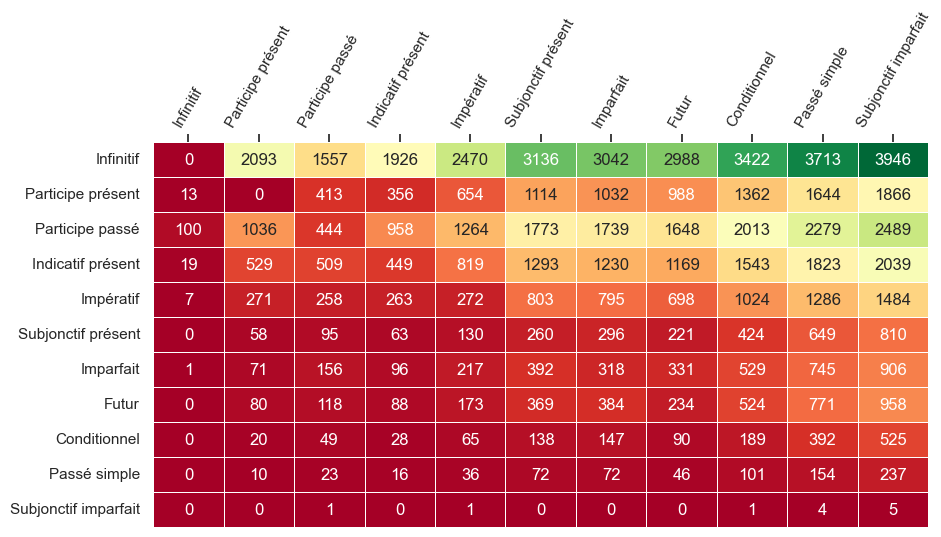

In [234]:
sns.set(rc={'figure.figsize':(10,5)})
ax=sns.heatmap(dfNonCoTemps,annot=True,linewidth=.5,cmap="RdYlGn",fmt=".0f",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='x', labelrotation=60)


#### Analyse des formes de l'imparfait du subjonctif dans l'input

In [116]:
dS4PersIS={}
casesIS=["is%d%s"%(n+1,p) for p in "SP" for n in range(3)]
print(casesIS)
S4IS=dfS4.loc[:,casesIS].dropna(thresh=1).index.tolist()
boolS4G2=(dfS4.index.str.endswith("ir"))&dfS4.pP.str.endswith("isâ")
dS4PersIS["G2"]=dfS4.loc[(dfS4.index.isin(S4IS))&boolS4G2].loc[:,casesIS].count().to_dict()
dS4PersIS["Global"]=dfS4.loc[(dfS4.index.isin(S4IS))].loc[:,casesIS].count().to_dict()
dfS4IS=pd.DataFrame(dS4PersIS)
dfS4IS.loc["Total"]=dfS4IS.sum()
dfS4IS["%G2"]=dfS4IS.G2/dfS4IS.Global
dfS4IS.columns.name = "Input"
dfS4IS.style.format({'G2': "{:.0f}",'Global': "{:.0f}",'%G2': "{:.2%}"})

['is1S', 'is2S', 'is3S', 'is1P', 'is2P', 'is3P']


Input,G2,Global,%G2
is1S,8,10,80.00%
is2S,9,10,90.00%
is3S,0,13,0.00%
is1P,2,3,66.67%
is2P,12,15,80.00%
is3P,0,2,0.00%
Total,31,53,58.49%


In [10]:
dfAttested=dfVLTotal.loc[dfVLTotal.frequency>0]
dfKnown=dfAttested.loc[dfAttested.frequency>8]
dfUnknown=dfAttested.loc[dfAttested.frequency<=8]
knownForms=dfKnown.count()["cell"]
knownVerbs=len(dfKnown.groupby("lexeme").count()["cell"])
unknownForms=dfUnknown.count()["cell"]
unknownVerbs=len(dfUnknown.groupby("lexeme").count()["cell"])
print(f"known:{knownForms}, unknown:{unknownForms}, total={knownForms+unknownForms}")
print(f"{knownVerbs}, {unknownVerbs}")
dfS4=pd.pivot(dfKnown,index="lexeme",columns="cell",values="phon_form")
dfR4=pd.pivot(dfUnknown,index="lexeme",columns="cell",values="phon_form")
dfS4

known:52596, unknown:54286, total=106882
4241, 5008


cell,cond.prs.1.pl,cond.prs.1.sg,cond.prs.2.pl,cond.prs.2.sg,cond.prs.3.pl,cond.prs.3.sg,imp.prs.1.pl,imp.prs.2.pl,imp.prs.2.sg,ind.fut.1.pl,...,sbjv.prs.2.pl,sbjv.prs.2.sg,sbjv.prs.3.pl,sbjv.prs.3.sg,sbjv.pst.1.pl,sbjv.pst.1.sg,sbjv.pst.2.pl,sbjv.pst.2.sg,sbjv.pst.3.pl,sbjv.pst.3.sg
lexeme,,,,,,,,,,,,,,,,,,,,,
abaisser,NaN,abɛsəʁE,abɛsəʁje,abɛsəʁE,NaN,abɛsəʁE,abEsɔ̃,abEse,abɛs,NaN,...,NaN,abɛs,NaN,abɛs,NaN,NaN,NaN,NaN,NaN,NaN
abandonner,abɑ̃dɔnəʁjɔ̃,abɑ̃dɔnəʁE,abɑ̃dɔnəʁje,abɑ̃dɔnəʁE,abɑ̃dɔnəʁE,abɑ̃dɔnəʁE,abɑ̃dOnɔ̃,abɑ̃dOne,abɑ̃dɔn,abɑ̃dɔnəʁɔ̃,...,abɑ̃dOnje,abɑ̃dɔn,abɑ̃dɔn,abɑ̃dɔn,NaN,NaN,NaN,NaN,NaN,NaN
abasourdir,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
abattre,NaN,abatʁE,NaN,NaN,abatʁE,abatʁE,abatɔ̃,abate,aba,abatʁɔ̃,...,abatje,abat,abat,abat,NaN,NaN,NaN,NaN,NaN,NaN
abdiquer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,abdik,NaN,...,NaN,NaN,NaN,abdik,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
éviscérer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
éviter,NaN,EvitəʁE,Evitəʁje,EvitəʁE,EvitəʁE,EvitəʁE,Evitɔ̃,Evite,Evit,Evitəʁɔ̃,...,Evitje,Evit,Evit,Evit,NaN,NaN,NaN,NaN,NaN,NaN
évoluer,NaN,NaN,NaN,NaN,NaN,EvOlyʁE,NaN,NaN,EvOly,NaN,...,NaN,NaN,EvOly,EvOly,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
print("verbes")
print(f"head:{len(dfS4.dropna(thresh=1))}, tail:{len(dfR4.dropna(thresh=1))}")
print("formes")
print(f"head:{dfS4.dropna(thresh=1).count().sum()}, tail:{dfR4.dropna(thresh=1).count().sum()}")

verbes
head:4241, tail:5008
formes
head:52596, tail:54286


### Heatmap des correspondances nbInput/nbTest

In [460]:
dfPairesSR=pd.concat([dfS4.count(axis=1),dfR4.count(axis=1)],axis=1)
dfPairesSR["nb"]=int(1)
dfPairesSR=dfPairesSR.fillna(0).astype("int")
dfCountSR=dfPairesSR.groupby([0,1]).count().reset_index()
dfCountSR=dfCountSR.loc[(dfCountSR[0]>0)&(dfCountSR[1]>0)]
dfCountSR["nbForms"]=((dfCountSR[0]+dfCountSR[1])*dfCountSR["nb"])
dfCountSR

,0,1,nb,nbForms
16,1,1,13,26
17,1,2,21,63
18,1,3,23,92
19,1,4,42,210
20,1,5,49,294
...,...,...,...,...
604,44,7,1,51
605,45,2,1,47
606,45,4,1,49
607,47,3,1,50


In [461]:
dfCountSRK=pd.pivot(dfCountSR,index=0,columns=1,values="nb")
# dfCountSRK

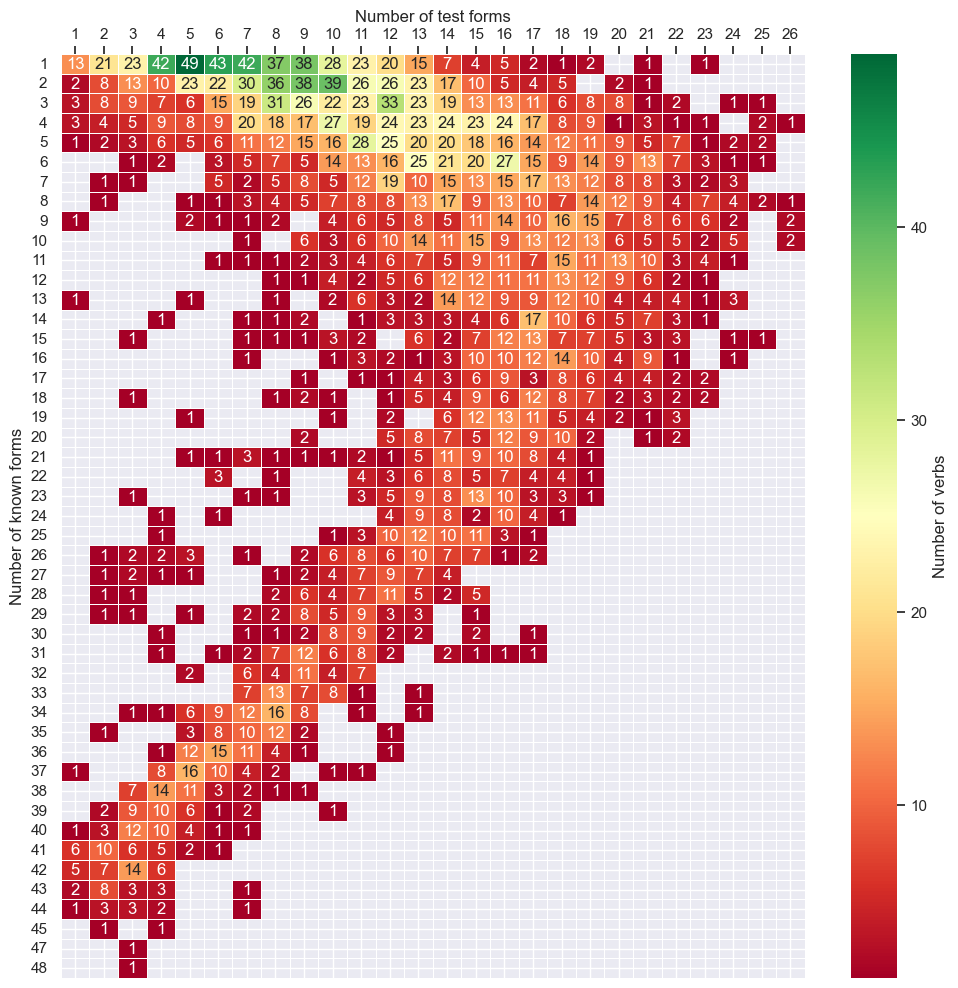

In [462]:
# sns.set(font_scale=2)
sns.set(rc={'figure.figsize':(12,12)})
ax=sns.heatmap(dfCountSRK,annot=True,linewidth=.5,cmap='RdYlGn',fmt=".0f",cbar=True)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
plt.xlabel('Number of test forms')
plt.ylabel('Number of known forms')
ax.xaxis.set_label_position('top')
ax.collections[0].colorbar.set_label("Number of verbs")
sns.set(font_scale=1)
plt.savefig(rep+"Cooccurrences-S4R4-Pairs.png",dpi=300,bbox_inches="tight")

In [463]:
dfS4.loc["gésir"].dropna()

cell
ii1S     ʒizE
ii2S     ʒizE
ii3P     ʒizE
ii3S     ʒizE
pP      ʒizɑ̃
pi1S       ʒi
pi2S       ʒi
pi3P      ʒiz
Name: gésir, dtype: object

### Heatmap des correspondances case Input/case Test

In [464]:
def coCells(dfInput,dfOutput):
    dfInOut=dfIn.join(dfOut, how="outer", lsuffix='_In', rsuffix='_Out')
    coCellsInOut={}
    for cell1 in cellOrd:
        t1=cell1+"_In"
        if t1 not in coCellsInOut:
            coCellsInOut[cell1]={}
        for cell2 in cellOrd:
            t2=cell2+"_Out"
            coCellsInOut[cell1][cell2]=dfInOut[(dfInOut[t1].notnull())&(dfInOut[t2].notnull())][t1].count()
    return dfInOut,pd.DataFrame(coCellsInOut)

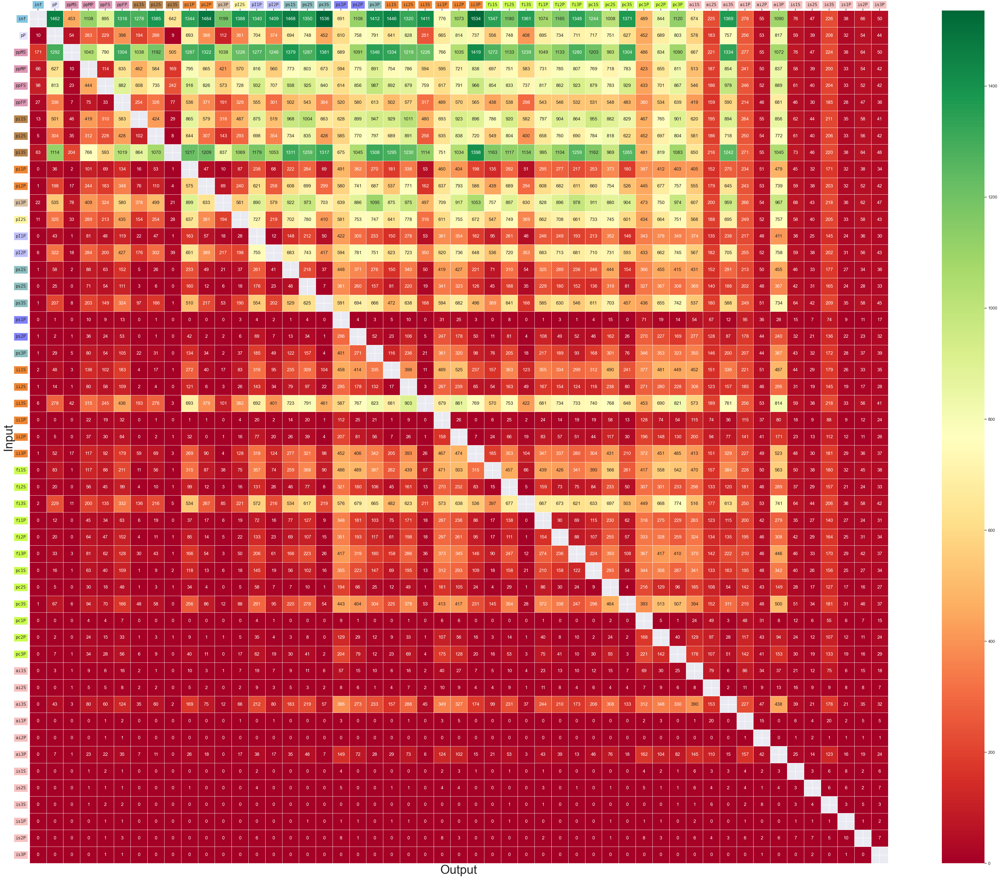

In [465]:
dfInOut,dfCoCells=coCells(dfS4,dfR4)
%store -r pltCellColors
sns.set_style("white")
sns.set(rc={'figure.figsize':(50,40)})
mask=np.full_like(dfCoCells, False, dtype=bool)
for i in range(51):
    mask[i,i]=True
ax=sns.heatmap(dfCoCells.T,mask=mask,annot=True,linewidth=.5,cmap='RdYlGn',fmt="d",cbar=True)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=12)
colorerYTicks(ax,fSize=12)
plt.xlabel("Output", fontsize = 32)
plt.ylabel("Input", fontsize = 32)
plt.savefig(rep+"Cooccurrences-InOut-Cells.png",dpi=300,bbox_inches="tight")

#### par sous-paradigme

In [186]:
def df2Subparadigms(df):
    dfT=df.T.reset_index()
    dfT.rename(columns={'cell': 'index'}, inplace=True)
    dfT.loc[:,"Subparadigm"]=dfT["index"].str[:2]
    dfT.loc[:,"Subparadigm"]=dfT.Subparadigm.replace(dTiroir)
    dfT.set_index("index",inplace=True)
    dfTSub=dfT.groupby("Subparadigm").count().T
    return dfTSub

In [467]:
def coSubs(dfInput,dfOutput):
    dfIn=df2Subparadigms(dfInput)
    dfOut=df2Subparadigms(dfOutput)
    dfInOut=dfIn.join(dfOut, how="outer", lsuffix='_In', rsuffix='_Out')
    coCellsInOut={}
    for cell1 in lTiroir:
        t1=cell1+"_In"
        if t1 not in coCellsInOut:
            coCellsInOut[cell1]={}
        for cell2 in lTiroir:
            t2=cell2+"_Out"
            n=(dfInOut[(dfInOut[t1]>0)&(dfInOut[t2]>0)][t1]\
               *dfInOut[(dfInOut[t1]>0)&(dfInOut[t2]>0)][t2]).sum()
            coCellsInOut[cell1][cell2]=int(round(n/(dNbTiroir[cell1]*dNbTiroir[cell2])))
    return dfInOut,pd.DataFrame(coCellsInOut)

In [468]:
tenseLabels

['Infinitive',
 'Present participle',
 'Past participle',
 'Indicative present',
 'Imperative',
 'Subjunctive present',
 'Imperfective',
 'Future',
 'Conditional',
 'Simple past',
 'Subjunctive imperfective']

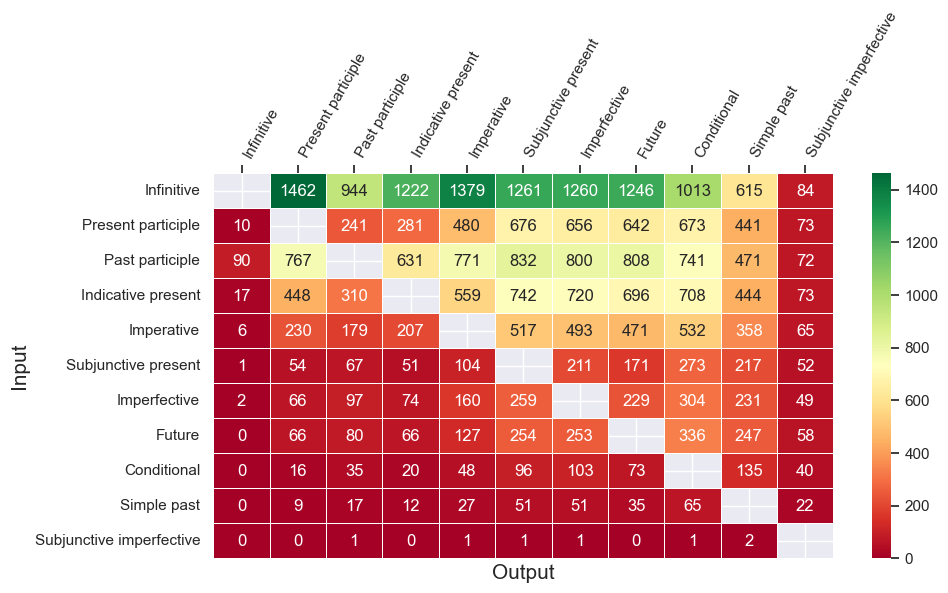

In [469]:
sns.set(rc={'figure.figsize':(10,5)})
dfInOut,dfCoSubs=coSubs(dfS4,dfR4)
mask=np.full_like(dfCoSubs, False, dtype=bool)
for i in range(len(tenseLabels)):
    mask[i,i]=True
ax=sns.heatmap(dfCoSubs.T,mask=mask,annot=True,linewidth=.5,cmap='RdYlGn',fmt="d",cbar=True)

ax.xaxis.tick_top()
ax.set_xticklabels(tenseLabels, ha="left")
ax.set_yticklabels(tenseLabels)
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)
plt.xlabel("Output", fontsize = 15)
plt.ylabel("Input", fontsize = 15)
plt.savefig(rep+"Cooccurrences-InOut-Subparadigms.png",dpi=300,bbox_inches="tight")

### Comptage des quadrants
- formes dans la tête
    - training : verbes avec des co-formes dans la tête
    - inputs : verbes dans la tête ET la queue
- formes dans la queue
    - test : verbes dans la tête ET la queue
    - reste : verbes seulement dans la queue

In [470]:
# print("Test only : %d\n"%len(R4Only),", ".join(R4Only))

dfR4Filt=dfR4.loc[~dfR4.index.isin(R4Only)]

In [471]:
# verbes et formes dans la tête
verbesS4=dfS4.T.count()[dfS4.T.count()>=1].count()
formesS4=dfS4.T.count()[dfS4.T.count()>=1].sum()
print(f"La tête contient {verbesS4} verbes et {formesS4} formes")
verbesR4=dfR4.T.count()[dfR4.T.count()>=1].count()
formesR4=dfR4.T.count()[dfR4.T.count()>=1].sum()
print(f"La queue contient {verbesR4} verbes et {formesR4} formes")


verbesTraining=dfS4.T.count()[dfS4.T.count()>1].count()
formesTraining=dfS4.T.count()[dfS4.T.count()>1].sum()
print(f"Le training contient {verbesTraining} verbes et {formesTraining} formes")

S4Only=[l for l in dfS4.index.tolist() if l not in dfR4.index.tolist()]
dfS4Filt=dfS4.loc[~dfS4.index.isin(S4Only)]
single=dfS4.T.count()[dfS4.T.count()==1].count()
print(f"{len(dfS4.T.count()[dfS4.T.count()==1])} verbes avec une seule forme sont exclus du training")

print(f"{len(S4Only)} verbes non-présents dans la queue et leurs {dfS4.loc[dfS4.index.isin(S4Only)].T.count().sum()} formes")

print(f"{verbesS4-len(S4Only)} verbes et leurs {dfS4.loc[~dfS4.index.isin(S4Only)].T.count().sum()} dans l'input set")
# dfS4.T.count()[dfS4.T.count()>1].count()
R4Only=[l for l in dfR4.index.tolist() if l not in dfS4.index.tolist()]
dfR4Filt=dfR4.loc[~dfR4.index.isin(R4Only)]
verbesTest=dfR4Filt.T.count().count()
formesTest=dfR4Filt.T.count().sum()
print(f"Le test contient {verbesTest} verbes et {formesTest} formes")
verbesExclus=dfR4.loc[dfR4.index.isin(R4Only)].T.count().count()
formesExclues=dfR4.loc[dfR4.index.isin(R4Only)].T.count().sum()
print(f"Le test exclut {verbesExclus} verbes et {formesExclues} formes dont les verbes ne sont pas présent dans l'input")


La tête contient 4241 verbes et 52596 formes
La queue contient 5008 verbes et 54286 formes
Le training contient 3818 verbes et 52173 formes
423 verbes avec une seule forme sont exclus du training
24 verbes non-présents dans la queue et leurs 228 formes
4217 verbes et leurs 52368 dans l'input set
Le test contient 4217 verbes et 51345 formes
Le test exclut 791 verbes et 2941 formes dont les verbes ne sont pas présent dans l'input


In [472]:
# dfR4.loc[dfR4.index.isin(R4Only)].T.count()

### Verbes sans infinitif ni participe passé dans l'input

In [473]:
ppNo=(dfS4Filt.ppMS.isnull())&(dfS4Filt.ppMP.isnull())&(dfS4Filt.ppFS.isnull())&(dfS4Filt.ppFP.isnull())
print(f"{len(dfS4Filt.loc[dfS4Filt.inf.isnull()])} verbes de l'input sans infinitif")
print(f"{len(dfS4Filt.loc[(dfS4Filt.inf.isnull())&ppNo])} verbes de l'input sans infinitif ni participe passé")
dictTemp=dfS4Filt.loc[(dfS4Filt.inf.isnull())&ppNo].T.to_dict()
# print(dictTemp)
dictPpNo={}
for k,v in dictTemp.items():
    dictPpNo[k]={kk:vv for kk,vv in v.items() if vv==vv}
    print(k,dictPpNo[k]) 

282 verbes de l'input sans infinitif
72 verbes de l'input sans infinitif ni participe passé
abouler {'pI2P': 'abule', 'pI2S': 'abul'}
adjurer {'pi1S': 'adʒyʁ'}
affectionner {'ii3S': 'afEksjOnE', 'pi1S': 'afEksjɔn', 'pi2P': 'afEksjOne', 'pi3P': 'afEksjɔn', 'pi3S': 'afEksjɔn'}
ailler {'ii1S': 'ajE', 'pI2P': 'aje', 'pI2S': 'aj', 'pP': 'ajɑ̃', 'pi1S': 'aj', 'pi3P': 'aj', 'pi3S': 'aj', 'ps1S': 'aj', 'ps2P': 'aje', 'ps3P': 'aj', 'ps3S': 'aj'}
ambitionner {'pi1S': 'ɑ̃bisjɔn', 'pi3S': 'ɑ̃bisjɔn'}
auner {'pi3S': 'ɔn'}
avoisiner {'pP': 'avwazinɑ̃', 'pi3P': 'avwazin', 'pi3S': 'avwazin'}
baller {'pI2S': 'bal'}
bicher {'pi3S': 'biʃ'}
bleuir {'pi3P': 'bløis', 'pi3S': 'bløi'}
bruiner {'pi3S': 'bʁɥin'}
canonner {'pI2P': 'kanOne'}
carguer {'pI2P': 'kaʁge'}
chicoter {'pi3S': 'ʃikɔt'}
chlinguer {'pi2S': 'ʃlɛ̃g', 'pi3S': 'ʃlɛ̃g'}
cliver {'pI2S': 'kliv'}
clopiner {'pP': 'klOpinɑ̃'}
conchier {'pi1S': 'kɔ̃ʃi'}
condescendre {'pP': 'kɔ̃dEsɑ̃dɑ̃'}
contrefoutre {'pi1S': 'kɔ̃tʁəfu', 'pi2S': 'kɔ̃tʁəfu', 'pi3S': 'k

In [474]:
ppNo=(dfS4Filt.ppMS.isnull())&(dfS4Filt.ppMP.isnull())&(dfS4Filt.ppFS.isnull())&(dfS4Filt.ppFP.isnull())
infNo=(dfS4Filt.inf.isnull())
pi3SNo=(dfS4Filt.pi3S.isnull())
ppMSNo=(dfS4Filt.ppMS.isnull())
filterDictNa(dfS4Filt.loc[pi3SNo].T)
filterDictNa(dfS4Filt.loc[pi3SNo&infNo].T)
filterDictNa(dfS4Filt.loc[pi3SNo&ppMSNo&infNo].T)
filterDictNa(dfS4Filt.loc[pi3SNo&ppNo&infNo].T)
filterDictNa(dfS4Filt.loc[infNo].T)
filterDictNa(dfS4Filt.loc[ppMSNo&infNo].T)
filterDictNa(dfS4Filt.loc[ppNo&infNo].T)
filterDictNa(dfS4Filt.loc[ppMSNo].T)
filterDictNa(dfS4Filt.loc[ppNo].T)

1032
213
47
26
282
93
72
601
560


### Co-formes par paires de cases

In [136]:
coformsK={}
for c1 in cellOrd:
    if c1 not in coformsK:
        coformsK[c1]={}
    for c2 in cellOrd:
        coformsK[c1][c2]=dfS4[(dfS4[c1].notnull())&(dfS4[c2].notnull())][c2].count()
dfCoformsK=pd.DataFrame(coformsK)
print(dfCoformsK.mean().mean())
coformsK["inf"]

481.5474817377931


{'inf': 3955,
 'pP': 1862,
 'ppMS': 3456,
 'ppMP': 2141,
 'ppFS': 2444,
 'ppFP': 1548,
 'pi1S': 2209,
 'pi2S': 1854,
 'pi3S': 3181,
 'pi1P': 959,
 'pi2P': 1656,
 'pi3P': 2314,
 'pI2S': 1804,
 'pI1P': 861,
 'pI2P': 1790,
 'ps1S': 982,
 'ps2S': 804,
 'ps3S': 1568,
 'ps1P': 181,
 'ps2P': 553,
 'ps3P': 821,
 'ii1S': 1081,
 'ii2S': 673,
 'ii3S': 1908,
 'ii1P': 274,
 'ii2P': 443,
 'ii3P': 1096,
 'fi1S': 1197,
 'fi2S': 681,
 'fi3S': 1631,
 'fi1P': 643,
 'fi2P': 720,
 'fi3P': 926,
 'pc1S': 765,
 'pc2S': 447,
 'pc3S': 1088,
 'pc1P': 110,
 'pc2P': 332,
 'pc3P': 454,
 'ai1S': 181,
 'ai2S': 31,
 'ai3S': 845,
 'ai1P': 35,
 'ai2P': 3,
 'ai3P': 354,
 'is1S': 10,
 'is2S': 10,
 'is3S': 13,
 'is1P': 3,
 'is2P': 15,
 'is3P': 2}

In [265]:
# dfCoformsK

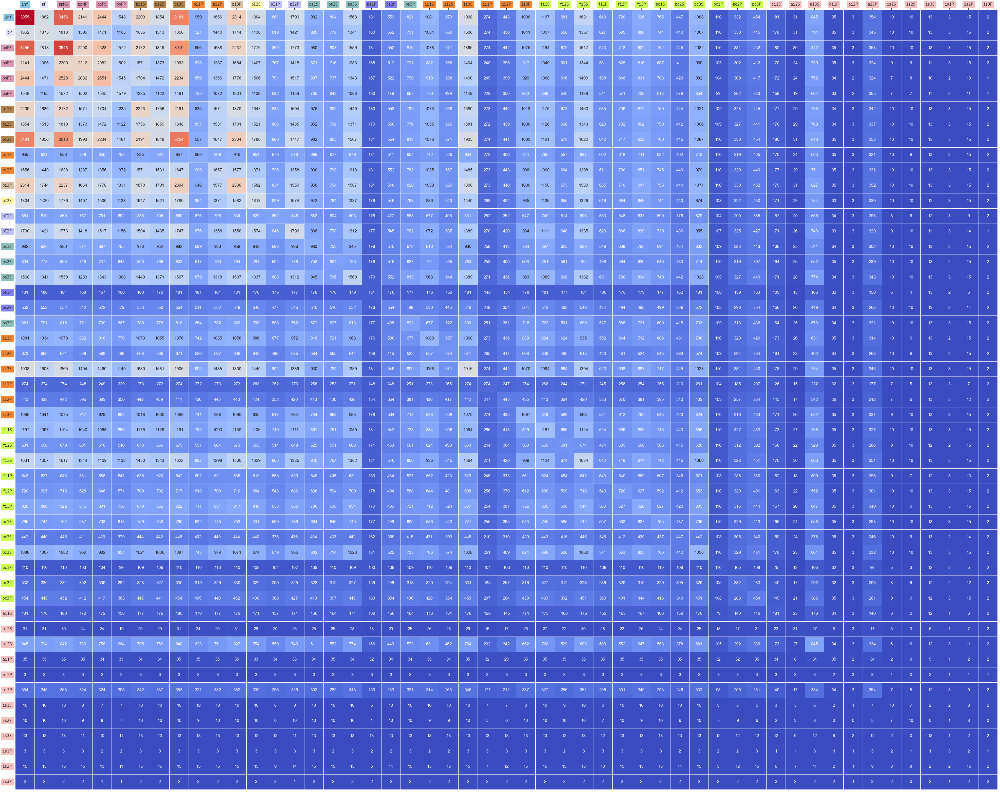

In [138]:
%store -r pltCellColors
sns.set_style("white")
sns.set(rc={'figure.figsize':(50,40)})
ax=sns.heatmap(dfCoformsK,annot=True,linewidth=.5,cmap="coolwarm",fmt="d",cbar=False)
ax.xaxis.tick_top()
ax.tick_params(axis='y', labelrotation=0)
colorerXTicks(ax,fSize=12)
colorerYTicks(ax,fSize=12)

In [139]:
def makeDictNb(df):
    dResult=pd.DataFrame({"nb":df.count(axis=1)}).reset_index().groupby("nb").count().to_dict()["lexeme"]
    for i in range(1,52):
        if i in dResult:
            dResult[i]=[dResult[i]]
        else:
            dResult[i]=[0]
    dfResult=pd.DataFrame(dResult).T
    dfResult.columns=["nb of lexemes"]
    return dfResult

In [140]:
dfR4Filt.T.count()

lexeme
abaisser      13
abandonner     3
abasourdir     7
abattre        8
abdiquer      19
              ..
éviscérer     16
éviter         3
évoluer       15
évoquer       10
être           3
Length: 4228, dtype: int64

### Distribution des nombres de formes par lexèmes pour les verbes absents de la queue

In [141]:
# dfS4.loc[dfS4.isnull().all(axis=1)]
S4Only=[l for l in dfS4.index.tolist() if l not in dfR4.index.tolist()]
# print("Training only : %d\n"%len(S4Only),", ".join(S4Only),"\n")
R4Only=[l for l in dfR4.index.tolist() if l not in dfS4.index.tolist()]
# print("Test only : %d\n"%len(R4Only),", ".join(R4Only))
dfS4Filt=dfS4.loc[~dfS4.index.isin(S4Only)]
dfR4Filt=dfR4.loc[~dfR4.index.isin(R4Only)]
print(dfS4.loc[dfS4.index.isin(S4Only)].count(axis=1).sort_values())
print(dfR4.loc[dfR4.index.isin(R4Only)].count(axis=1).to_string())

lexeme
accroire         1
chaloir          1
discontinuer     1
quérir           1
refabriquer      1
sataner          1
cafeter          2
urger            2
ressortir2       3
bonder           4
aider           42
travailler      42
utiliser        42
retrouver       43
dtype: int64
lexeme
abominer                5
aboucher                3
abstraire               2
abâtardir               6
abêtir                  9
achopper                4
affadir                 5
affleurer               6
affriander              2
affrioler               3
affurer                 1
agglomérer              8
agonir                  2
ahaner                  4
ahurir                  7
alanguir                3
alcaliniser             2
alentir                 1
alphabétiser            6
aléser                  3
ambler                  1
ambrer                  4
ameublir                2
amourer                 1
anatomiser              1
angler                  1
angliciser              2
anthr

accroire {'inf': 'akrwar'}
aider {'ai1S': 'EdE', 'ai3P': 'EdEr', 'ai3S': 'Eda', 'fi1P': 'Ed6rô', 'fi1S': 'Ed6rE', 'fi2P': 'Ed6re', 'fi2S': 'Ed6ra', 'fi3P': 'Ed6rô', 'fi3S': 'Ed6ra', 'ii1P': 'Edjô', 'ii1S': 'EdE', 'ii2P': 'Edje', 'ii2S': 'EdE', 'ii3P': 'EdE', 'ii3S': 'EdE', 'inf': 'Ede', 'pI1P': 'Edô', 'pI2P': 'Ede', 'pI2S': 'Ed', 'pP': 'Edâ', 'pc1P': 'Ed6rjô', 'pc1S': 'Ed6rE', 'pc2P': 'Ed6rje', 'pc2S': 'Ed6rE', 'pc3P': 'Ed6rE', 'pc3S': 'Ed6rE', 'pi1P': 'Edô', 'pi1S': 'Ed', 'pi2P': 'Ede', 'pi2S': 'Ed', 'pi3P': 'Ed', 'pi3S': 'Ed', 'ppFP': 'Ede', 'ppFS': 'Ede', 'ppMP': 'Ede', 'ppMS': 'Ede', 'ps1P': 'Edjô', 'ps1S': 'Ed', 'ps2P': 'Edje', 'ps2S': 'Ed', 'ps3P': 'Ed', 'ps3S': 'Ed'}
bonder {'ppFP': 'bôde', 'ppFS': 'bôde', 'ppMP': 'bôde', 'ppMS': 'bôde'}
cafeter {'inf': 'kaf6te', 'ppMS': 'kaf6te'}
chaloir {'pi3S': 'So'}
discontinuer {'inf': 'diskôtinHe'}
quérir {'inf': 'kErir'}
refabriquer {'inf': 'r6fabrike'}
ressortir2 {'pI1P': 'r6sOrtisô', 'pi1P': 'r6sOrtisô', 'pi3S': 'r6sOrti'}
retrouver {'a

/opt/anaconda3/lib/python3.11/site-packages/matplotlib/text.py:754: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(self._y))
/opt/anaconda3/lib/python3.11/site-packages/matplotlib/text.py:895: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  y = float(self.convert_yunits(self._y))


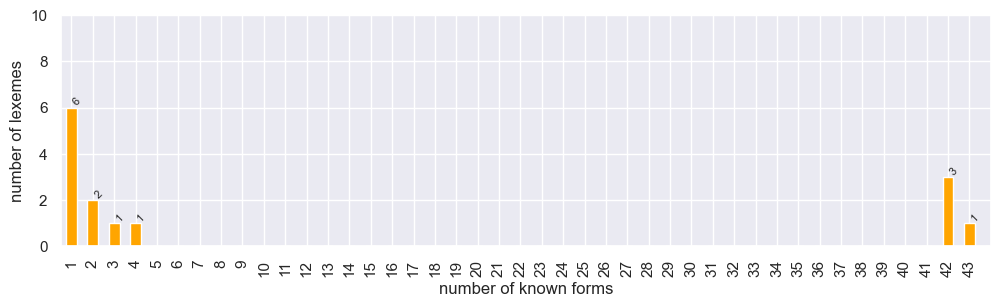

In [142]:
dfS4Ext=dfS4.loc[dfS4.index.isin(S4Only)]
for k,v in {col:dfS4Ext.T[col].dropna().to_dict() for col in dfS4Ext.T}.items():
    print(k,v)
dS4Ext=makeDictNb(dfS4Ext)
xlim=max(dS4Ext.loc[dS4Ext["nb of lexemes"]>0].index.tolist())
# print(dS4Ext.loc[dS4Ext.index<int(xlim)])
print(dS4Ext.sort_index(inplace=True))
print(xlim)
ax=dS4Ext.iloc[:,:xlim].plot(kind="bar",figsize=(12,3),color="orange")
ax.set_xlim(-0.5,xlim)
ax.set_xlabel("number of known forms")
ax.set_ylim(0,10)
ax.set_ylabel("number of lexemes")
ax.set_xticks(range(0,xlim))
for i in range(xlim):
    if dS4Ext.iloc[i,0]!=0:
        # xytext introduces a slight offset so the text doesn't sit directly on the marker
        plt.text(i, dS4Ext.iloc[i], f'{dS4Ext.iloc[i].values[0]}', ha='left', va='bottom', fontsize=8,rotation=45)
ax.get_legend().remove()
plt.savefig(rep+"Distribution-S4Ext-FormsLexemes.png",dpi=300,bbox_inches="tight")

### Distribution des formes par lexèmes pour les verbes seulement présent dans la queue

In [143]:
dfR4Ext=dfR4.loc[dfR4.index.isin(R4Only)]
{col:dfR4Ext.T[col].dropna().to_dict() for col in dfR4Ext.T}

{'abominer': {'fi1S': 'abOmin6rE',
  'pi1S': 'abOmin',
  'pi3S': 'abOmin',
  'ppFS': 'abOmine',
  'ppMP': 'abOmine'},
 'aboucher': {'inf': 'abuSe', 'ppFS': 'abuSe', 'ppMS': 'abuSe'},
 'abstraire': {'inf': 'apstrEr', 'pi3S': 'apstrE'},
 'abâtardir': {'ai3S': 'abatardi',
  'fi3S': 'abatardira',
  'ii3S': 'abatardisE',
  'pP': 'abatardisâ',
  'pi3S': 'abatardi',
  'ppMS': 'abatardi'},
 'abêtir': {'inf': 'abEtir',
  'pI1P': 'abEtisô',
  'pI2P': 'abEtise',
  'pi1S': 'abEti',
  'pi3P': 'abEtis',
  'pi3S': 'abEti',
  'ppFS': 'abEti',
  'ppMP': 'abEti',
  'ppMS': 'abEti'},
 'achopper': {'ii3S': 'aSOpE', 'inf': 'aSOpe', 'pi3P': 'aSOp', 'pi3S': 'aSOp'},
 'affadir': {'fi3S': 'afadira',
  'inf': 'afadir',
  'pi3S': 'afadi',
  'ppMS': 'afadi',
  'ps3S': 'afadis'},
 'affleurer': {'ii3P': 'afl2rE',
  'ii3S': 'afl2rE',
  'inf': 'afl2re',
  'pi3P': 'afl9r',
  'pi3S': 'afl9r',
  'ps3S': 'afl9r'},
 'affriander': {'inf': 'afrijâde', 'pi3S': 'afrijâd'},
 'affrioler': {'inf': 'afrijOle', 'pP': 'afrijOlâ', '

    nb of lexemes
1             177
2             125
3             128
4             104
5              79
6              59
7              52
8              28
9              18
10             10
11              2
12              4
13              2
14              2
15              1
16              0
17              0
18              0
19              0
20              0
21              0
22              0
23              0
24              0
25              0
26              0
27              0
28              0
29              0
30              0
31              0
32              0
33              0
34              0
35              0
36              0
37              0
38              0
39              0
40              0
41              0
42              0
43              0
44              0
45              0
46              0
47              0
48              0
49              0
50              0
51              0
15


/opt/anaconda3/lib/python3.11/site-packages/matplotlib/text.py:754: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(self._y))
/opt/anaconda3/lib/python3.11/site-packages/matplotlib/text.py:895: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  y = float(self.convert_yunits(self._y))


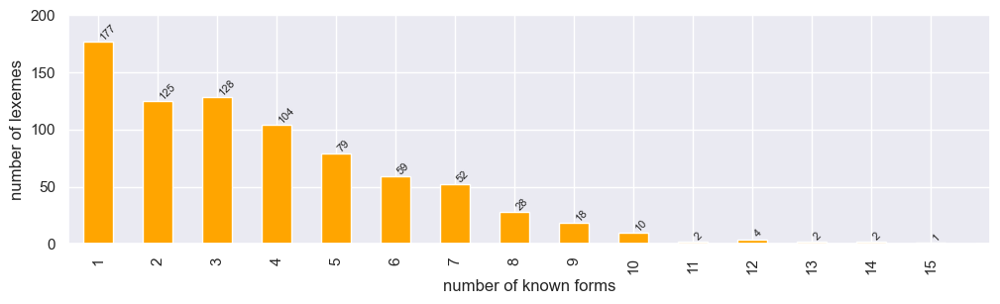

In [144]:
dR4Ext=makeDictNb(dfR4Ext)
xlim=max(dR4Ext.loc[dR4Ext["nb of lexemes"]>0].index.tolist())
# print(dR4Ext.loc[dR4Ext.index<int(xlim)])
print(dR4Ext)
print(xlim)
ax=dR4Ext.iloc[:,:xlim].plot(kind="bar",figsize=(12,3),color="orange")
ax.set_xlim(-0.5,xlim)
ax.set_xlabel("number of known forms")
ax.set_ylim(0,200)
ax.set_ylabel("number of lexemes")
ax.set_xticks(range(0,xlim))
for i in range(xlim):
    # xytext introduces a slight offset so the text doesn't sit directly on the marker
    plt.text(i, dR4Ext.iloc[i], f'{dR4Ext.iloc[i].values[0]}', ha='left', va='bottom', fontsize=8,rotation=45)
ax.get_legend().remove()
plt.savefig(rep+"Distribution-R4Ext-FormsLexemes.png",dpi=300,bbox_inches="tight")

### Distribution des formes par lexèmes dans l'input et dans le test

In [145]:
print(f"{dfS4Filt.T.count().mean():.1f} formes d'input en moyenne")
print(f"{dfR4Filt.T.count().mean():.1f} formes de test en moyenne")


12.6 formes d'input en moyenne
12.4 formes de test en moyenne


In [146]:
dS4Forms=makeDictNb(dfS4Filt)
dR4Forms=makeDictNb(dfR4Filt)

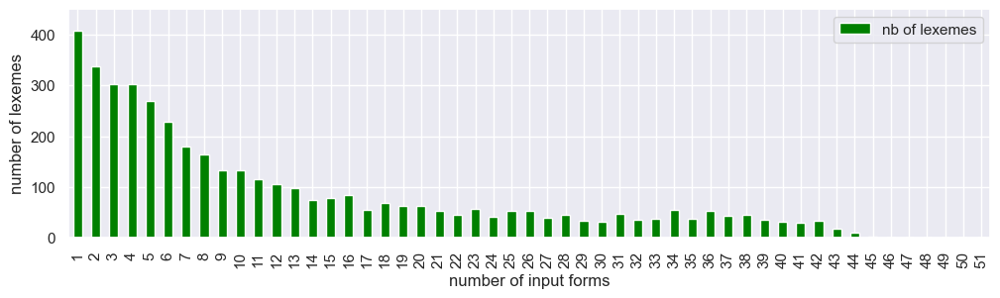

In [147]:
ax=dS4Forms.plot(kind="bar",figsize=(12,3),color="green")
ax.set_xlim(-0.5,50.5)
ax.set_xlabel("number of input forms")
ax.set_ylim(0,450)
ax.set_ylabel("number of lexemes")
ax.set_xticks(range(0,51))
plt.savefig(rep+"Distribution-S4-FormsLexemes.png",dpi=300,bbox_inches="tight")
# dS4Forms

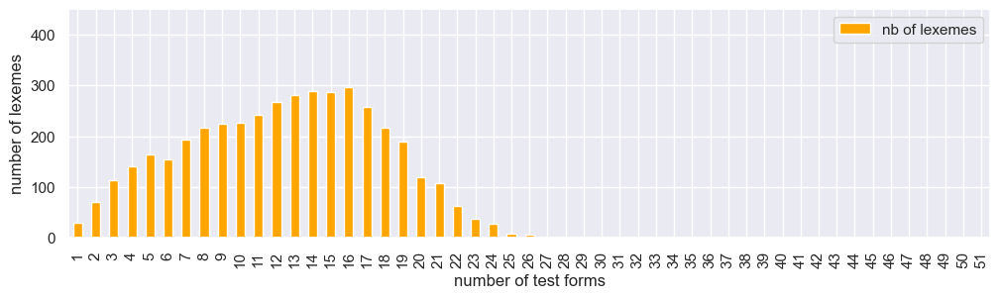

In [148]:
ax=dR4Forms.plot(kind="bar",figsize=(12,3),color="orange")
ax.set_xlim(-0.5,50.5)
ax.set_xlabel("number of test forms")
ax.set_ylim(0,450)
ax.set_ylabel("number of lexemes")
ax.set_xticks(range(0,51))
plt.savefig(rep+"Distribution-R4-FormsLexemes.png",dpi=300,bbox_inches="tight")

In [149]:
dS4R4Forms=pd.concat([dS4Forms,dR4Forms],axis=1)
dS4R4Forms.columns=["input","test"]


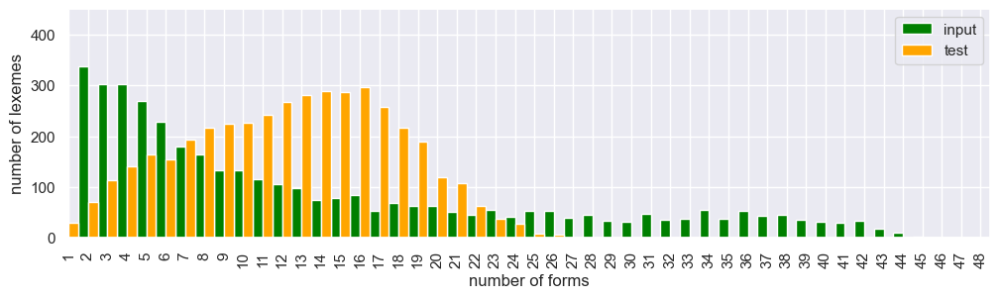

In [150]:
ax=dS4R4Forms.plot(kind="bar",figsize=(12,3),color=["green","orange"],width=1)
ax.set_xlim(-0.5,50.5)
ax.set_xlabel("number of forms")
ax.set_xlim(0,47.5)
ax.set_ylim(0,450)
ax.set_ylabel("number of lexemes")
ax.set_xticks(range(0,48))
plt.savefig(rep+"Distribution-S4R4-FormsLexemes.png",dpi=300,bbox_inches="tight")

In [151]:
dNbTiroir={"Infinitif":1, "Participe présent":1, "Participe passé":4, "Indicatif présent":6, "Impératif":3, "Subjonctif présent":6, "Imparfait":6, "Futur":6, "Conditionnel":6, "Passé simple":6, "Subjonctif imparfait":6}

In [152]:
t1="Infinitif"
t2="Impératif"
dfT=dfS4.T.reset_index()
dfT.loc[:,"Subparadigm"]=dfT["index"].str[:2]
dfT.loc[:,"Subparadigm"]=dfT.Subparadigm.replace(dTiroir)
dfT.set_index("index",inplace=True)
dfTSub=dfT.groupby("Subparadigm").count().T
n=(dfTSub[(dfTSub[t1]>0)&(dfTSub[t2]>0)][t1]*dfTSub[(dfTSub[t1]>0)&(dfTSub[t2]>0)][t2]).sum()
int(round(n/(dNbTiroir[t1]*dNbTiroir[t2])))
# int(round(dfTSub[(dfTSub[t1]>0)&(dfTSub[t2]>0)][t2].sum()/(dNbTiroir[t1]*dNbTiroir[t2])))

1485

## Distribution par sous-paradigmes
#### groupSubparadigms

In [153]:
def groupSubparadigms(df):
    dfT=df.T.reset_index()
    dfT.loc[:,"Subparadigm"]=dfT["index"].str[:2]
    dfT.loc[:,"Subparadigm"]=dfT.Subparadigm.replace(dTiroir)
    dfT.set_index("index",inplace=True)
    dfTSub=dfT.groupby("Subparadigm").count().T
    coformsT={}
    for t1 in lTiroir:
        if t1 not in coformsT:
            coformsT[t1]={}
        for t2 in lTiroir:
            n=(dfTSub[(dfTSub[t1]>0)&(dfTSub[t2]>0)][t1]\
               *dfTSub[(dfTSub[t1]>0)&(dfTSub[t2]>0)][t2]).sum()
            coformsT[t1][t2]=int(round(n/(dNbTiroir[t1]*dNbTiroir[t2])))
    return dfTSub,pd.DataFrame(coformsT)

In [154]:
t1="Futur"
t2="Imparfait"
n=dfPivotT[(dfPivotT[t1].notnull())&(dfPivotT[t2].notnull())][t1].count()

coformsT={}
coformsT2={}
for t1 in lTiroir:
    if t1 not in coformsT:
        coformsT[t1]={}
    for t2 in lTiroir:
        n=(dfPivotT[(dfPivotT[t1].notnull())&(dfPivotT[t2].notnull())][t1]\
           *dfPivotT[(dfPivotT[t1].notnull())&(dfPivotT[t2].notnull())][t2]).sum()
        coformsT[t1][t2]=int(round(n/(dNbTiroir[t1]*dNbTiroir[t2])))

for t1 in lTiroir:
    if t1 not in coformsT2:
        coformsT2[t1]={}
    for t2 in lTiroir:
        n2=dfPivotT[(dfPivotT[t1].notnull())&(dfPivotT[t2].notnull())][t1].count()
        coformsT2[t1][t2]=n2

coformsT,coformsT2

({'Infinitif': {'Infinitif': 4829,
   'Participe présent': 3464,
   'Participe passé': 3678,
   'Indicatif présent': 3418,
   'Impératif': 2961,
   'Subjonctif présent': 2097,
   'Imparfait': 2220,
   'Futur': 2188,
   'Conditionnel': 1531,
   'Passé simple': 866,
   'Subjonctif imparfait': 93},
  'Participe présent': {'Infinitif': 3464,
   'Participe présent': 3483,
   'Participe passé': 2972,
   'Indicatif présent': 2954,
   'Impératif': 2618,
   'Subjonctif présent': 1956,
   'Imparfait': 2079,
   'Futur': 2036,
   'Conditionnel': 1463,
   'Passé simple': 829,
   'Subjonctif imparfait': 91},
  'Participe passé': {'Infinitif': 3678,
   'Participe présent': 2972,
   'Participe passé': 3360,
   'Indicatif présent': 2903,
   'Impératif': 2598,
   'Subjonctif présent': 1899,
   'Imparfait': 1945,
   'Futur': 1981,
   'Conditionnel': 1416,
   'Passé simple': 803,
   'Subjonctif imparfait': 88},
  'Indicatif présent': {'Infinitif': 3418,
   'Participe présent': 2954,
   'Participe passé': 

In [408]:
dfS4T,dfS4Coforms=groupSubparadigms(dfS4)
dfR4T,dfR4Coforms=groupSubparadigms(dfR4)
dfS4R4=pd.DataFrame({"head":dfS4T.sum(),"tail":dfR4T.sum()}).reindex(lTiroir)
dfS4R4.loc[:,"coverage"]=round(dfS4R4["head"]/(dfS4R4["head"]+dfS4R4["tail"])*100).astype(int).astype(str)+"%"
dfS4Coforms.to_csv("TEMP.csv")

KeyError: 'index'

### Distribution input/output par sous-paradigme

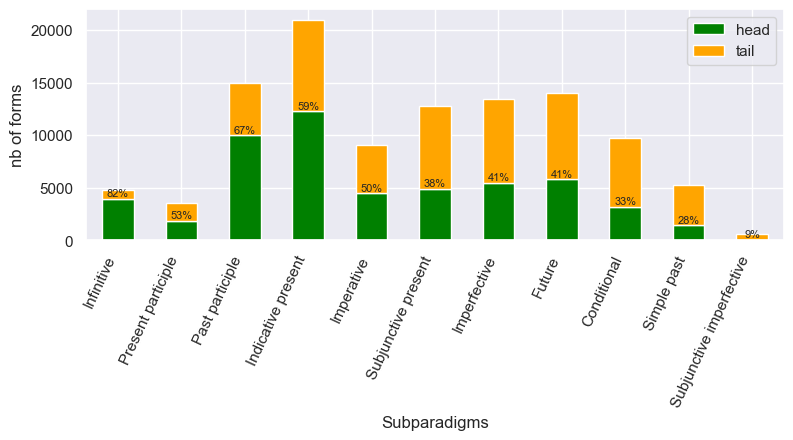

In [156]:
ax=dfS4R4.plot.bar(stacked=True,figsize=(9,3),color=["green","orange",])
ax.set_xlabel("Subparadigms")
ax.set_ylabel("nb of forms")
ax.set_xticklabels(tenseLabels,rotation=65,ha="right")

covLabels=dfS4R4["coverage"].tolist()
rects=ax.patches
for rect, label in zip(rects, covLabels):
    height=rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom", fontsize=8
    )
plt.savefig(rep+"Distribution-S4-FormsTenses.png",dpi=300,bbox_inches="tight")

In [157]:
dfS4T

Subparadigm,Conditionnel,Futur,Imparfait,Impératif,Indicatif présent,Infinitif,Participe passé,Participe présent,Passé simple,Subjonctif imparfait,Subjonctif présent
lexeme,,,,,,,,,,,
abaisser,4,3,1,3,6,1,4,1,0,0,3
abandonner,6,6,6,3,6,1,4,1,3,0,6
abasourdir,0,0,0,0,0,1,3,0,0,0,0
abattre,3,6,3,3,6,1,4,1,2,0,5
abdiquer,0,0,0,1,3,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
éviscérer,0,0,0,0,1,1,3,0,0,0,0
éviter,5,6,6,3,6,1,4,1,1,0,6
évoluer,1,3,3,1,6,1,4,1,1,0,2


### Heatmap des paires de training par sous-paradigme

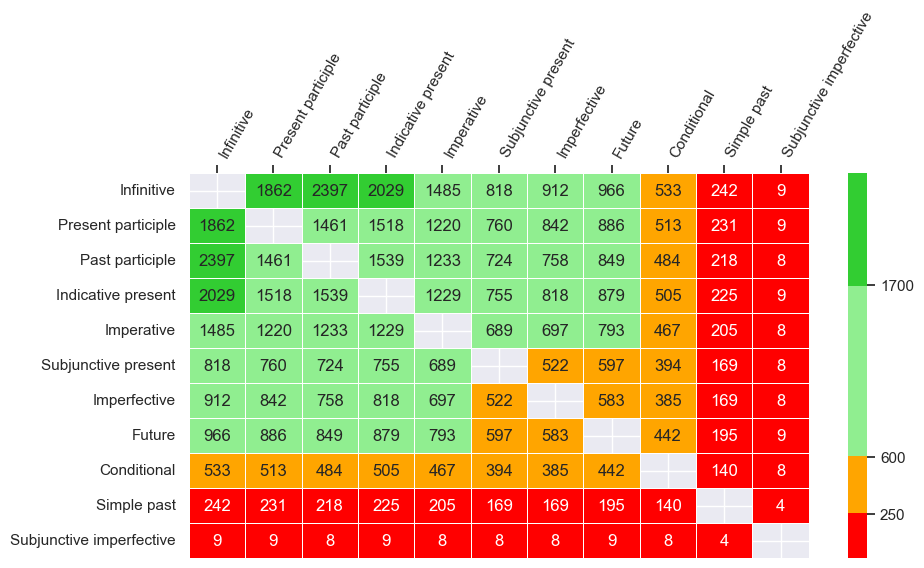

In [158]:
cm=["red","red","red","red",
    "orange", "orange", "orange", "orange", "orange", 
    "lightgreen", "lightgreen", "lightgreen", "lightgreen", "lightgreen",
    "lightgreen", "lightgreen", "lightgreen", "lightgreen", "lightgreen",
    "lightgreen", "lightgreen", "lightgreen", "lightgreen", "lightgreen",
    "limegreen", "limegreen", "limegreen", "limegreen", "limegreen",
    "limegreen", "limegreen", "limegreen", "limegreen", "limegreen",
    # "green", "green", "green", "green", "green",
    # "green", "green", "green", "green", "green",
    ]

sns.set(rc={'figure.figsize':(10,5)})
mask=np.full_like(dfS4Coforms, False, dtype=bool)
for i in range(11):
    mask[i,i]=True
ax=sns.heatmap(dfS4Coforms,mask=mask,annot=True,linewidth=.5,cmap=cm,fmt="d",cbar=True)
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([280, 630, 1700])
colorbar.set_ticklabels(['250', '600', '1700'])

ax.xaxis.tick_top()
ax.set_xticklabels(tenseLabels, ha="left")
ax.set_yticklabels(tenseLabels)
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)
plt.savefig(rep+"Cooccurrences-S4-FormsTenses.png",dpi=300,bbox_inches="tight")

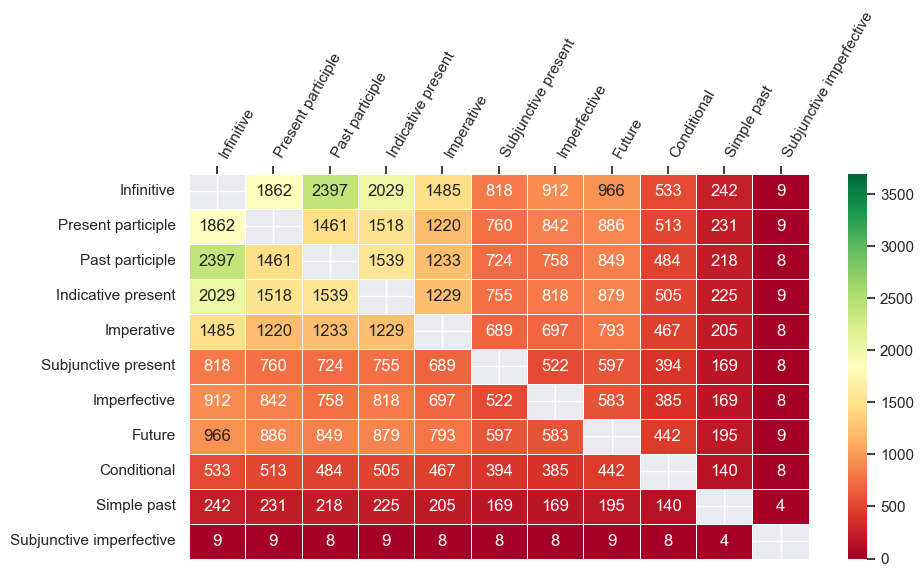

In [159]:
sns.set(rc={'figure.figsize':(10,5)})
mask=np.full_like(dfS4Coforms, False, dtype=bool)
for i in range(11):
    mask[i,i]=True
ax=sns.heatmap(dfS4Coforms,mask=mask,annot=True,linewidth=.5,cmap='RdYlGn',fmt="d",cbar=True,vmin=0,vmax=3700)
colorbar = ax.collections[0].colorbar
# colorbar.set_ticks([500,1000,1500,2000])
# colorbar.set_ticklabels(['500','1000','1500','2000'])

ax.xaxis.tick_top()
ax.set_xticklabels(tenseLabels, ha="left")
ax.set_yticklabels(tenseLabels)
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)
plt.savefig(rep+"Cooccurrences-S4-FormsTenses.png",dpi=300,bbox_inches="tight")

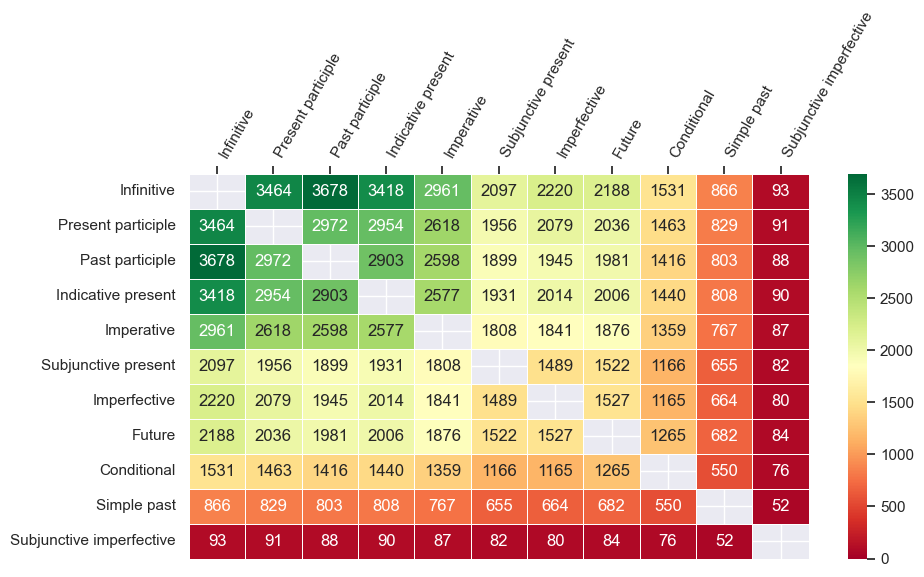

In [160]:
dfTemp=pd.DataFrame(coformsT)
sns.set(rc={'figure.figsize':(10,5)})
mask=np.full_like(dfTemp, False, dtype=bool)
for i in range(11):
    mask[i,i]=True
ax=sns.heatmap(dfTemp,mask=mask,annot=True,linewidth=.5,cmap='RdYlGn',fmt="d",cbar=True,vmin=0,vmax=3700)
colorbar = ax.collections[0].colorbar
# colorbar.set_ticks([500,1000,1500,2000])
# colorbar.set_ticklabels(['500','1000','1500','2000'])

ax.xaxis.tick_top()
ax.set_xticklabels(tenseLabels, ha="left")
ax.set_yticklabels(tenseLabels)
ax.tick_params(axis='x', labelrotation=60)
ax.tick_params(axis='y', labelrotation=0)
plt.savefig(rep+"Cooccurrences-VL2-FormsTenses.png",dpi=300,bbox_inches="tight")

In [161]:
dfTemp=dfS4Coforms.melt()
dfTemp[(dfTemp.value>580)&(dfTemp.value<690)]

,variable,value
49,Impératif,689
59,Subjonctif présent,689
62,Subjonctif présent,597
72,Imparfait,595
73,Imparfait,583
82,Futur,597
83,Futur,583


In [162]:
53485/4242/51*100

24.7224302262159

In [163]:
dSwim

{'cond.prs.1.pl': 'pc1P',
 'cond.prs.1.sg': 'pc1S',
 'cond.prs.2.pl': 'pc2P',
 'cond.prs.2.sg': 'pc2S',
 'cond.prs.3.pl': 'pc3P',
 'cond.prs.3.sg': 'pc3S',
 'imp.prs.1.pl': 'pI1P',
 'imp.prs.2.pl': 'pI2P',
 'imp.prs.2.sg': 'pI2S',
 'ind.fut.1.pl': 'fi1P',
 'ind.fut.1.sg': 'fi1S',
 'ind.fut.2.pl': 'fi2P',
 'ind.fut.2.sg': 'fi2S',
 'ind.fut.3.pl': 'fi3P',
 'ind.fut.3.sg': 'fi3S',
 'ind.ipfv.1.pl': 'ii1P',
 'ind.ipfv.1.sg': 'ii1S',
 'ind.ipfv.2.pl': 'ii2P',
 'ind.ipfv.2.sg': 'ii2S',
 'ind.ipfv.3.pl': 'ii3P',
 'ind.ipfv.3.sg': 'ii3S',
 'ind.prs.1.pl': 'pi1P',
 'ind.prs.1.sg': 'pi1S',
 'ind.prs.2.pl': 'pi2P',
 'ind.prs.2.sg': 'pi2S',
 'ind.prs.3.pl': 'pi3P',
 'ind.prs.3.sg': 'pi3S',
 'ind.pst.1.pl': 'ai1P',
 'ind.pst.1.sg': 'ai1S',
 'ind.pst.2.pl': 'ai2P',
 'ind.pst.2.sg': 'ai2S',
 'ind.pst.3.pl': 'ai3P',
 'ind.pst.3.sg': 'ai3S',
 'inf': 'inf',
 'ptcp.prs': 'pP',
 'ptcp.pst.f.pl': 'ppFP',
 'ptcp.pst.f.sg': 'ppFS',
 'ptcp.pst.m.pl': 'ppMP',
 'ptcp.pst.m.sg': 'ppMS',
 'sbjv.prs.1.pl': 'ps1P',

In [ ]:
from scipy.stats import entropy
x=97.3
entropy([x,100-x],base=2)
# entropy([91.3,8.7],base=2)

In [ ]:
# +len(dfSimple)#
+len(dfVide)

In [ ]:
fInput4=repOut+"vlexique2-S4.csv"
fResultD4=repOut+"vlexique2-Direct-S4.csv"
fResultS4=repOut+"vlexique2-S4-omp-Swim2-StemSpace.csv"
fResultD4Diff=repOut+"vlexique2-Direct-S4-gold-different.csv"

dfInput4=pd.read_csv(fInput4,sep=";").set_index("lexeme")[cellOrd]
dfResultD4=pd.read_csv(fResultD4,sep=";").set_index("lexeme")[cellOrd]
dfResultS4=pd.read_csv(fResultS4,sep=";").set_index("lexeme")[cellOrd]
dfResultD4Diff=refillDF(pd.read_csv(fResultD4Diff,sep=";"))
# display(dfInput4.loc[["amollir"]].T.dropna())
# display(dfResultD4.loc[:,:"pi3P"])
# display(dfResultS4.loc[["amollir"],:"pi3P"])
wrongPres=dfResultD4Diff.loc[:,"pi1S":"pi3P"].dropna(thresh=1).index.tolist()
print(dfResultD4.loc[dfResultD4.index.isin(wrongPres),"pi1S":"pi3P"].to_string())



In [14]:
%store -r pltCellColors
pltCellColors

{'ii1P': (0.9411764705882353, 0.5254901960784314, 0.2),
 'ii1S': (0.9411764705882353, 0.5254901960784314, 0.2),
 'is2S': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'is1S': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'pP': (0.9019607843137255, 0.9019607843137255, 0.9921568627450981),
 'ai3S': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'ai3P': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'is3P': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'is3S': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'ai1P': (0.9647058823529412, 0.7607843137254902, 0.7568627450980392),
 'ii3S': (0.9411764705882353, 0.5254901960784314, 0.2),
 'ps3S': (0.5529411764705883, 0.7450980392156863, 0.7450980392156863),
 'ps3P': (0.5529411764705883, 0.7450980392156863, 0.7450980392156863),
 'ii3P': (0.9411764705882353, 0.5254901960784314, 0.2),
 'pi2S': (0.7137254901960784, 0.5098039215686274, 0.2941176470588235